                                                                                              >> pratik gaikwad

#  _Maternal Health Risk Prediction_

##  Business Problem:
Healthcare systems struggle to identify and prioritize high-risk pregnancies, leading to preventable complications and higher maternal mortality rates. 

By building a reliable prediction model, we can help doctors identify risks early, provide timely care, and improve outcomes for mothers and babies. 

This will save lives and make healthcare more efficient.



## Problem Statement:
Maternal health risks during pregnancy can lead to severe complications or even death if not identified early. 

Current methods often fail to predict these risks accurately, especially in resource-limited settings. 

The goal is to use machine learning to predict maternal health risk levels (Low, Medium, High) based on factors like Age, SystolicBP, DiastolicBP, 

BS,BodyTemp,HeartRate,RiskLevel,Hemoglobin,BMI,Parity,SmokingStatus,PhysicalActivityLevel


## Import libraries 

In [9]:
import numpy as np  # For numerical operations and array manipulation.

import pandas as pd  # For data manipulation and analysis (DataFrames).

import matplotlib.pyplot as plt  # For creating static visualizations.

import seaborn as sns  # For advanced and attractive visualizations.

from statsmodels.stats.outliers_influence import variance_inflation_factor  # For checking multicollinearity (VIF).

import scipy.stats  # For statistical calculations and tests.

from scipy.stats import shapiro, chi2, normaltest, kstest, zscore  # For specific statistical tests and standardization.

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV  # For splitting data and hyperparameter tuning.

from sklearn.linear_model import LogisticRegression  # For implementing logistic regression models.

from sklearn.tree import DecisionTreeClassifier, plot_tree  # For building and visualizing decision tree models.

from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier  # For creating random forest models,AdaBoost,Gradient Boosting.

import xgboost
from xgboost import XGBClassifier  # For classification

from sklearn.svm import SVC  # Support Vector Classifier

from sklearn.neighbors import KNeighborsClassifier # import KNN algorithm 

from sklearn.naive_bayes import MultinomialNB # import naive bayes multinomialalgorithm

from sklearn.metrics import ConfusionMatrixDisplay  # For visualizing confusion matrices.

# For evaluating classification models.
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, multilabel_confusion_matrix

# generates a human-readable, text-based representation of the decision tree, displaying the decision rules, features, and thresholds at each node.
from sklearn.tree import export_text

import warnings
warnings.simplefilter('ignore')  # Ignores specific runtime warnings.


## Data Gathering

In [11]:
# import data and convert it into Pandas Dataframe
df=pd.read_csv("Maternal_Health_Dataset.csv")
df

,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate,RiskLevel,Hemoglobin,BMI,Parity,SmokingStatus,PhysicalActivityLevel
0,31.0,130.6,86.3,119.1,98.0,99.4,mid risk,12.0,28.7,2.0,No,Moderate
1,35.0,152.2,93.4,187.0,98.0,118.6,high risk,12.0,31.2,2.0,No,Moderate
2,29.0,124.2,87.2,112.0,100.0,74.6,mid risk,12.0,27.2,2.0,No,Low
3,30.0,147.6,99.6,172.3,98.0,101.5,high risk,12.0,36.0,2.0,No,Moderate
4,35.0,127.9,83.7,111.1,98.0,66.8,mid risk,12.0,28.6,2.0,No,Low
...,...,...,...,...,...,...,...,...,...,...,...,...
29995,39.0,148.4,96.1,165.4,98.4,119.5,high risk,11.9,39.2,2.0,No,Low
29996,39.0,144.1,109.4,126.3,99.3,107.0,high risk,12.1,35.7,4.0,No,Moderate
29997,26.0,179.5,108.0,187.1,99.1,119.9,high risk,11.7,38.7,4.0,Yes,High
29998,43.0,177.5,92.5,178.7,98.8,100.0,high risk,12.6,39.2,2.0,Yes,Low


## EDA (Exploratory Data Analysis)

In [13]:
# check for no. of rows and no. of columns
df.shape

(30000, 12)

In [14]:
# check for size of dataset
df.size

360000

In [15]:
# check for information about dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Age                    30000 non-null  float64
 1   SystolicBP             30000 non-null  float64
 2   DiastolicBP            30000 non-null  float64
 3   BS                     30000 non-null  float64
 4   BodyTemp               30000 non-null  float64
 5   HeartRate              30000 non-null  float64
 6   RiskLevel              30000 non-null  object 
 7   Hemoglobin             30000 non-null  float64
 8   BMI                    30000 non-null  float64
 9   Parity                 30000 non-null  float64
 10  SmokingStatus          30000 non-null  object 
 11  PhysicalActivityLevel  29924 non-null  object 
dtypes: float64(9), object(3)
memory usage: 2.7+ MB


In [16]:
# check for stats
df.describe()

,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate,Hemoglobin,BMI,Parity
count,30000.000000,30000.000000,30000.000000,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,31.066567,145.308193,92.333180,139.95204,98.607277,98.420163,11.992427,31.368147,1.997067
std,7.827719,22.301102,11.739923,34.69909,0.714186,16.938125,1.161097,5.453661,1.351586
min,10.000000,90.000000,60.000000,70.00000,95.900000,60.000000,6.600000,18.500000,0.000000
25%,25.000000,129.675000,84.800000,111.90000,98.100000,85.900000,11.300000,27.400000,1.000000
50%,31.000000,147.400000,93.700000,139.60000,98.600000,103.700000,12.000000,31.800000,2.000000
75%,37.000000,163.800000,101.825000,169.70000,99.000000,111.900000,12.700000,36.000000,3.000000
max,70.000000,180.000000,110.000000,200.00000,103.000000,120.000000,17.100000,40.000000,4.000000


In [17]:
# check datatype of columns
df.dtypes

Age                      float64
SystolicBP               float64
DiastolicBP              float64
BS                       float64
BodyTemp                 float64
HeartRate                float64
RiskLevel                 object
Hemoglobin               float64
BMI                      float64
Parity                   float64
SmokingStatus             object
PhysicalActivityLevel     object
dtype: object

### checking and Handling of missing value

In [19]:
# check count of null value
df.isna().sum()

Age                       0
SystolicBP                0
DiastolicBP               0
BS                        0
BodyTemp                  0
HeartRate                 0
RiskLevel                 0
Hemoglobin                0
BMI                       0
Parity                    0
SmokingStatus             0
PhysicalActivityLevel    76
dtype: int64

In [20]:
# fill null values replaced by mode
df['PhysicalActivityLevel']=df['PhysicalActivityLevel'].fillna(df['PhysicalActivityLevel'].mode()[0])

In [21]:
# check and Handle null values
df.isna().sum()

Age                      0
SystolicBP               0
DiastolicBP              0
BS                       0
BodyTemp                 0
HeartRate                0
RiskLevel                0
Hemoglobin               0
BMI                      0
Parity                   0
SmokingStatus            0
PhysicalActivityLevel    0
dtype: int64

## univariate analysis of columns

### Statistical analysis of numerical columns

In [24]:
# create a function for calculating statistical analysis of numerical column
from scipy.stats import skew, mode
def cal_stats(data, column_name):
    column = data[column_name]
    # Calculating statistics
    stats = {
        'Mean': column.mean(),
        'Median': column.median(),
        'Mode': mode(column)[0],
        'Min': column.min(),
        'Max': column.max(),
        'Range': column.max() - column.min(),
        'Variance': column.var(),
        'Standard Deviation': column.std(),
        'Skewness': skew(column),
    } 
    df1=pd.DataFrame.from_dict(stats,orient='index',columns=['Statistics'])
    return df1

In [25]:
#1] Age
cal_stats(df,"Age")

,Statistics
Mean,31.066567
Median,31.000000
Mode,31.000000
Min,10.000000
Max,70.000000
Range,60.000000
Variance,61.273178
Standard Deviation,7.827719
Skewness,0.076649


In [26]:
# 2] SystolicBP
cal_stats(df,'SystolicBP')

,Statistics
Mean,145.308193
Median,147.400000
Mode,171.400000
Min,90.000000
Max,180.000000
Range,90.000000
Variance,497.339152
Standard Deviation,22.301102
Skewness,-0.459557


In [27]:
# 3] DiastolicBP
cal_stats(df,'DiastolicBP')

,Statistics
Mean,92.333180
Median,93.700000
Mode,102.800000
Min,60.000000
Max,110.000000
Range,50.000000
Variance,137.825801
Standard Deviation,11.739923
Skewness,-0.643022


In [28]:
# 4] BS
cal_stats(df,'BS')

,Statistics
Mean,139.952040
Median,139.600000
Mode,101.200000
Min,70.000000
Max,200.000000
Range,130.000000
Variance,1204.026834
Standard Deviation,34.699090
Skewness,-0.061595


In [29]:
# 5] BodyTemp
cal_stats(df,'BodyTemp')

,Statistics
Mean,98.607277
Median,98.600000
Mode,98.600000
Min,95.900000
Max,103.000000
Range,7.100000
Variance,0.510061
Standard Deviation,0.714186
Skewness,0.426619


In [30]:
# 6] HeartRate
cal_stats(df,'HeartRate')

,Statistics
Mean,98.420163
Median,103.700000
Mode,103.300000
Min,60.000000
Max,120.000000
Range,60.000000
Variance,286.900089
Standard Deviation,16.938125
Skewness,-0.748146


In [31]:
# 7] Hemoglobin
cal_stats(df,'Hemoglobin')

,Statistics
Mean,11.992427
Median,12.000000
Mode,12.000000
Min,6.600000
Max,17.100000
Range,10.500000
Variance,1.348147
Standard Deviation,1.161097
Skewness,0.011876


In [32]:
# 8] BMI
cal_stats(df,'BMI')

,Statistics
Mean,31.368147
Median,31.800000
Mode,38.000000
Min,18.500000
Max,40.000000
Range,21.500000
Variance,29.742414
Standard Deviation,5.453661
Skewness,-0.379652


### visualization of numerical data by histogram

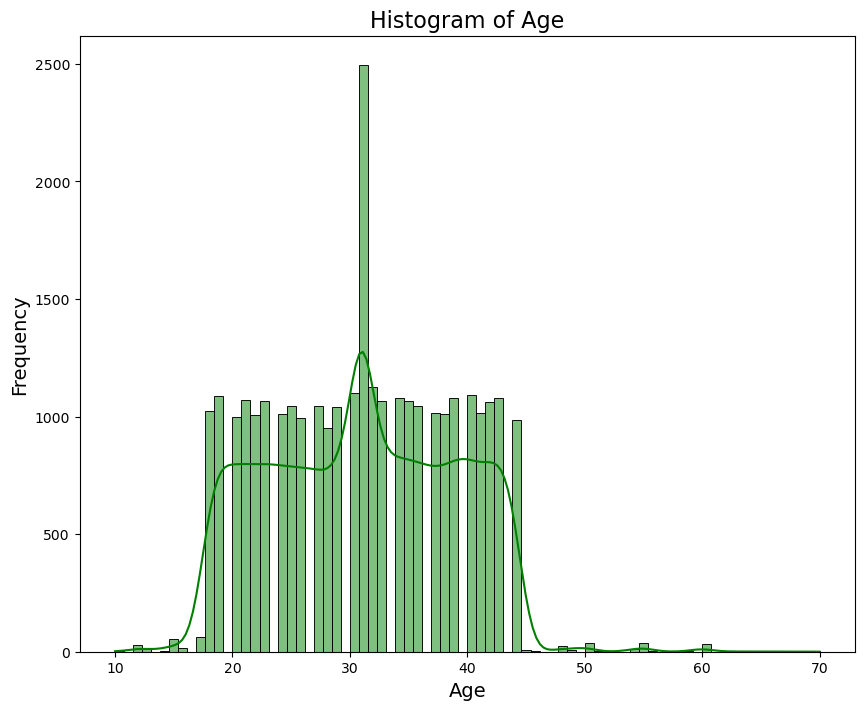

In [34]:
plt.figure(figsize=(10, 8))
sns.histplot(df["Age"], kde = True, color = "Green")
plt.title('Histogram of Age', fontsize=16)
plt.xlabel('Age', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

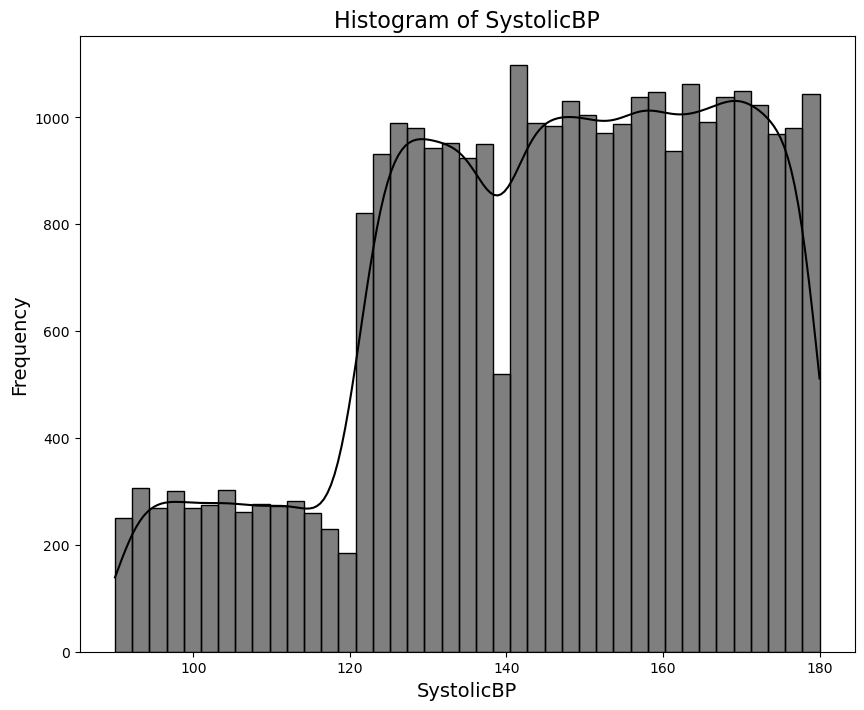

In [35]:
plt.figure(figsize=(10, 8))
sns.histplot(df["SystolicBP"], kde = True, color = "Black")
plt.title('Histogram of SystolicBP', fontsize=16)
plt.xlabel('SystolicBP', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

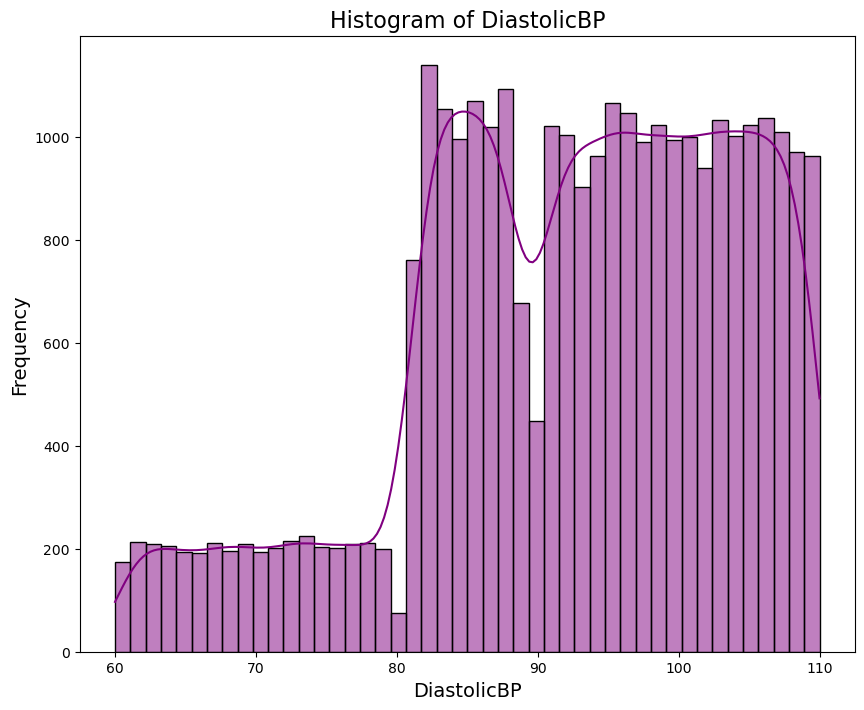

In [36]:
# DiastolicBP
plt.figure(figsize=(10, 8))
sns.histplot(df["DiastolicBP"], kde = True, color = 'Purple')
plt.title('Histogram of DiastolicBP', fontsize=16)
plt.xlabel('DiastolicBP', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

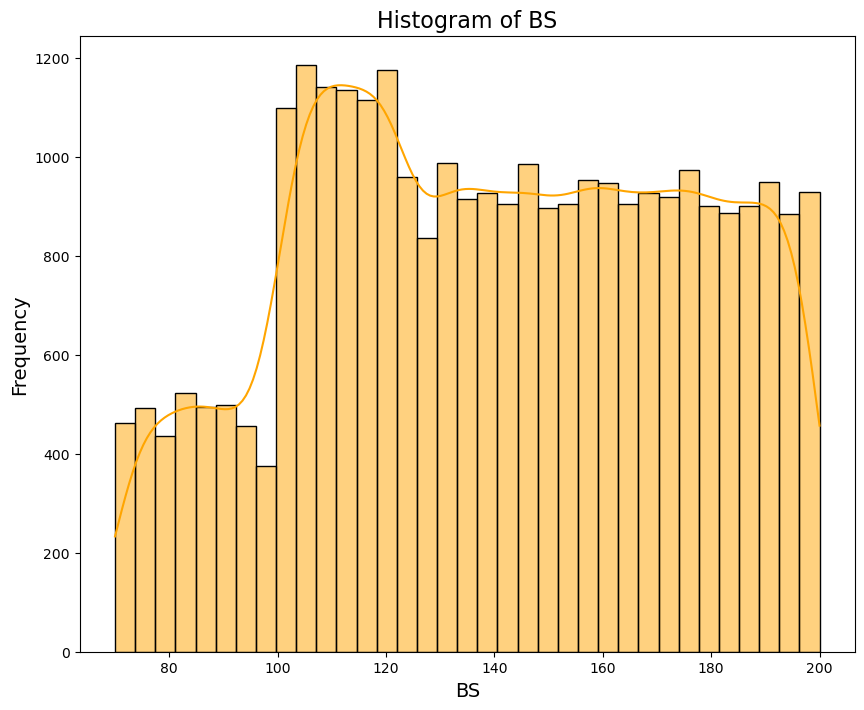

In [37]:
# BS
plt.figure(figsize=(10, 8))
sns.histplot(df["BS"], kde = True, color = 'Orange')
plt.title('Histogram of BS', fontsize=16)
plt.xlabel('BS', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

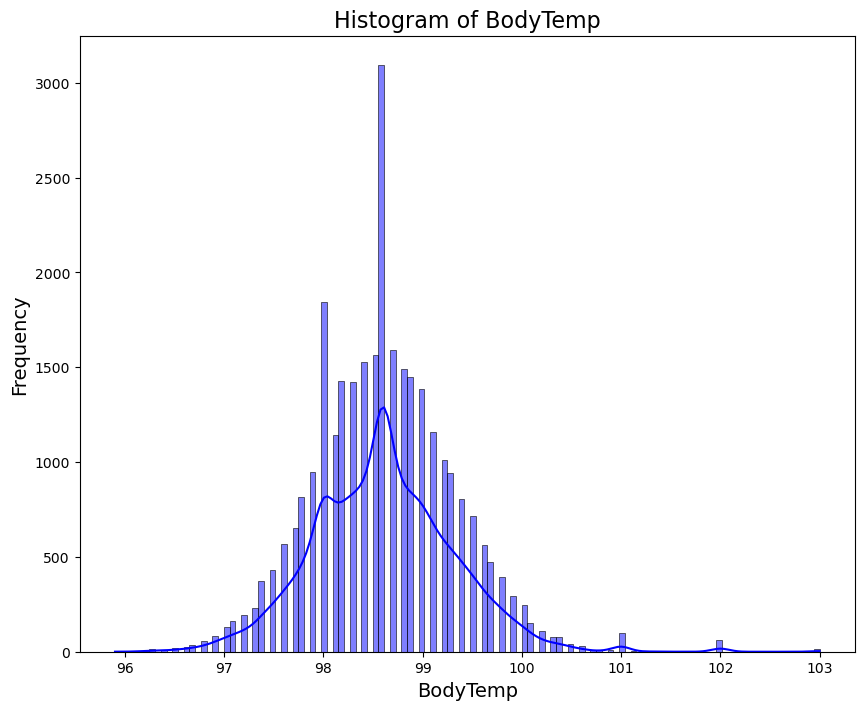

In [38]:
# BodyTemp
plt.figure(figsize=(10, 8))
sns.histplot(df["BodyTemp"], kde = True, color = 'Blue')
plt.title('Histogram of BodyTemp', fontsize=16)
plt.xlabel('BodyTemp', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

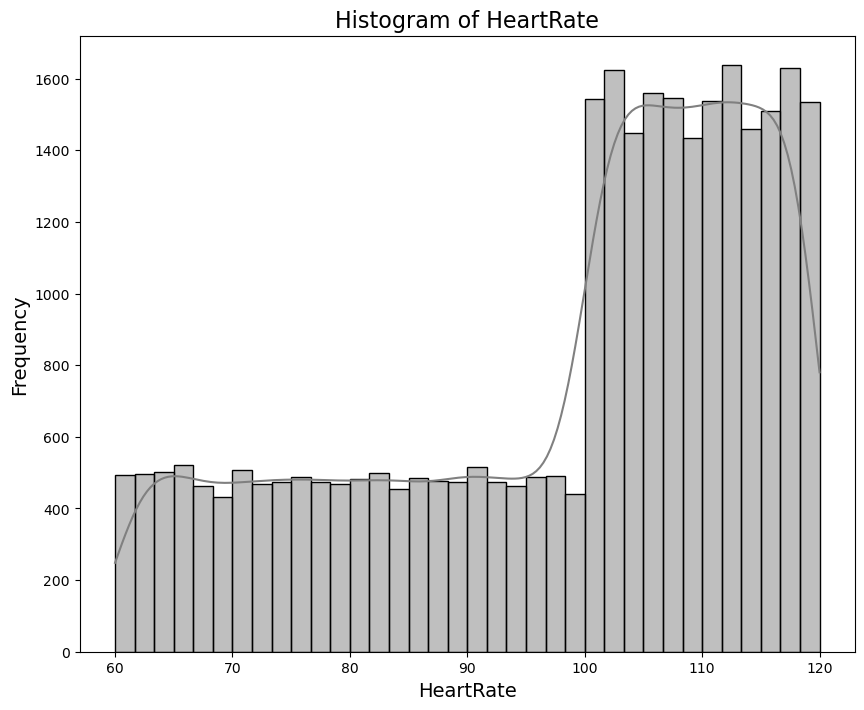

In [39]:
# HeartRate
plt.figure(figsize=(10, 8))
sns.histplot(df["HeartRate"], kde = True, color = 'Grey')
plt.title('Histogram of HeartRate', fontsize=16)
plt.xlabel('HeartRate', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

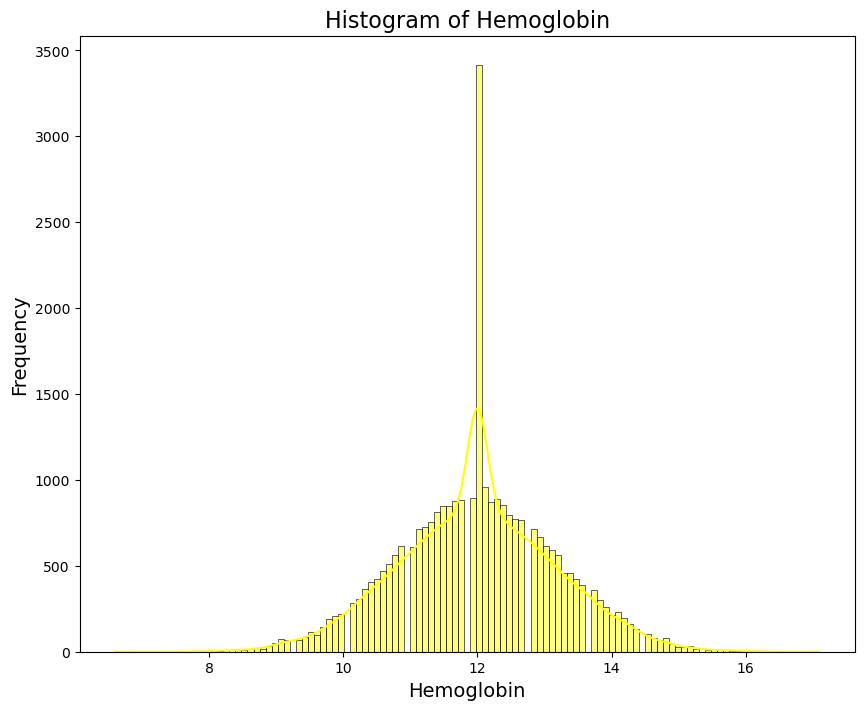

In [40]:
# Hemoglobin
plt.figure(figsize=(10, 8))
sns.histplot(df["Hemoglobin"], kde = True, color = 'Yellow')
plt.title('Histogram of Hemoglobin', fontsize=16)
plt.xlabel('Hemoglobin', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

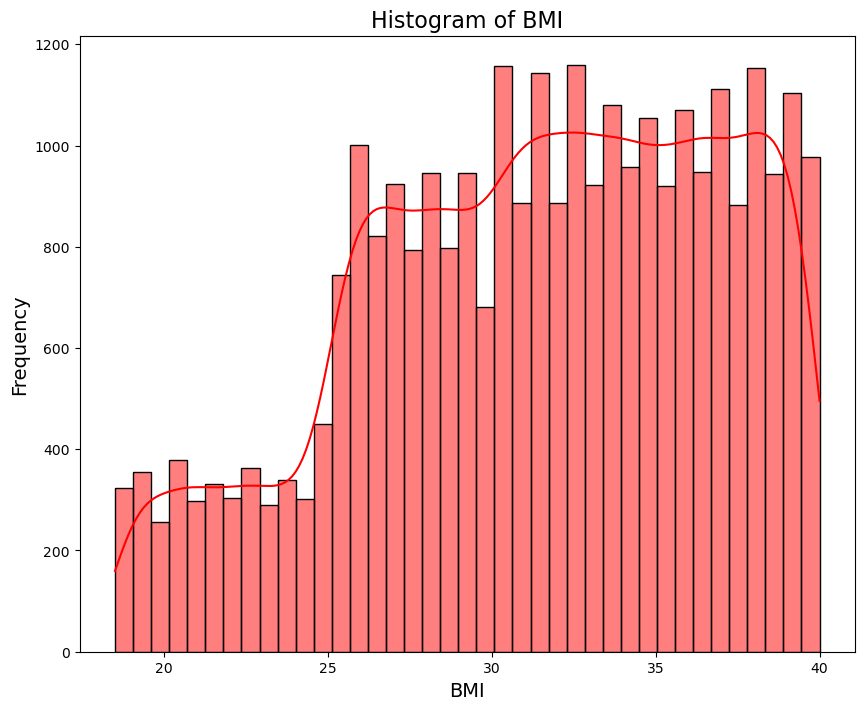

In [41]:
# BMI
plt.figure(figsize=(10, 8))
sns.histplot(df["BMI"], kde = True, color = 'Red')
plt.title('Histogram of BMI', fontsize=16)
plt.xlabel('BMI', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

### Finding and handling outliers of numerical column

In [43]:
# checking and handling of outliers

def Checking_and_Handling_Of_Outliers(df, col):
    sns.boxplot(df[col], color = "Red")
    plt.title(f"Boxplot for {col}")
    plt.show()
        
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)

    iqr = q3 - q1

    LowerTail = q1 - 1.5*iqr
    UpperTail = q3 + 1.5*iqr

    print(f"25% Quantile q1 = {q1}\n75% Quantile q3 = {q3}\nIQR = {iqr}\n")
    print("-"*80)
    print(f"Lower Tail = {LowerTail}\nUpper Tail = {UpperTail}")
    print("-"*80)

    # Checking for Outliers
    Outliers = df[(df[col] < LowerTail) | (df[col] > UpperTail)]
    print("\nOutliers :\n",Outliers)
    print("-"*80)

    #HAndling of Outliers :
    df.loc[df[col] < LowerTail, col] = LowerTail # all outliers less than lowertail, assigned by lowertail value
    df.loc[df[col] > UpperTail, col] = UpperTail # all outliers greater than uppertail, assigned by uppertail value

    print("After handling of Outliers data:\n")
    print(df.head())

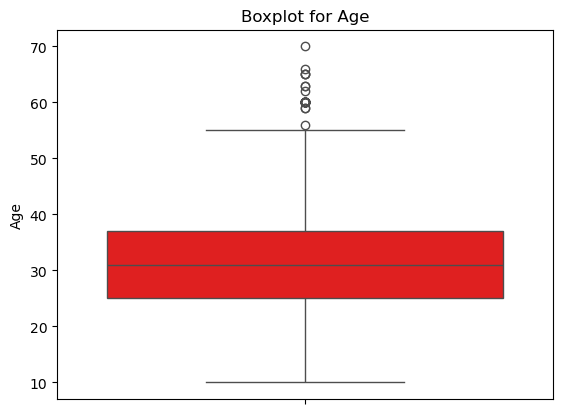

25% Quantile q1 = 25.0
75% Quantile q3 = 37.0
IQR = 12.0

--------------------------------------------------------------------------------
Lower Tail = 7.0
Upper Tail = 55.0
--------------------------------------------------------------------------------

Outliers :
        Age  SystolicBP  DiastolicBP     BS  BodyTemp  HeartRate  RiskLevel  \
36    60.0       131.1         82.9  103.0      98.0       68.9   mid risk   
54    60.0       127.7         81.4  112.5      98.0       76.9   mid risk   
91    60.0       127.2         88.3  104.6      98.0       90.3   mid risk   
99    60.0        94.0         77.5   92.3      98.0       94.4   low risk   
114   63.0       171.4         93.4  153.4      98.0      109.9  high risk   
181   60.0       129.6         82.7  116.4      98.0       60.6   mid risk   
184   60.0       135.5         81.5  103.2      98.0       82.7   mid risk   
213   60.0       122.3         81.9  109.5      98.0       94.3   mid risk   
277   60.0       134.3        

In [44]:
Checking_and_Handling_Of_Outliers(df,'Age')

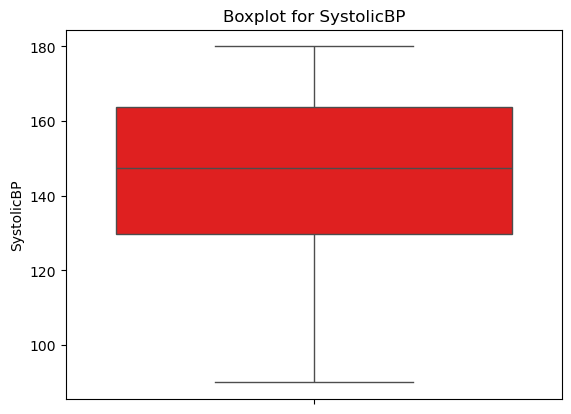

25% Quantile q1 = 129.67499999999998
75% Quantile q3 = 163.8
IQR = 34.12500000000003

--------------------------------------------------------------------------------
Lower Tail = 78.48749999999994
Upper Tail = 214.98750000000007
--------------------------------------------------------------------------------

Outliers :
 Empty DataFrame
Columns: [Age, SystolicBP, DiastolicBP, BS, BodyTemp, HeartRate, RiskLevel, Hemoglobin, BMI, Parity, SmokingStatus, PhysicalActivityLevel]
Index: []
--------------------------------------------------------------------------------
After handling of Outliers data:

    Age  SystolicBP  DiastolicBP     BS  BodyTemp  HeartRate  RiskLevel  \
0  31.0       130.6         86.3  119.1      98.0       99.4   mid risk   
1  35.0       152.2         93.4  187.0      98.0      118.6  high risk   
2  29.0       124.2         87.2  112.0     100.0       74.6   mid risk   
3  30.0       147.6         99.6  172.3      98.0      101.5  high risk   
4  35.0       127.9  

In [45]:
Checking_and_Handling_Of_Outliers(df,'SystolicBP')

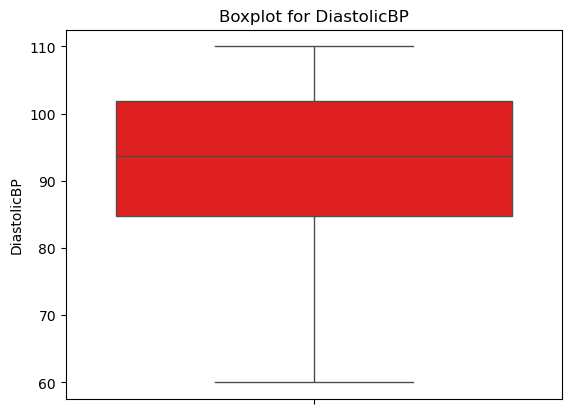

25% Quantile q1 = 84.8
75% Quantile q3 = 101.825
IQR = 17.025000000000006

--------------------------------------------------------------------------------
Lower Tail = 59.26249999999999
Upper Tail = 127.36250000000001
--------------------------------------------------------------------------------

Outliers :
 Empty DataFrame
Columns: [Age, SystolicBP, DiastolicBP, BS, BodyTemp, HeartRate, RiskLevel, Hemoglobin, BMI, Parity, SmokingStatus, PhysicalActivityLevel]
Index: []
--------------------------------------------------------------------------------
After handling of Outliers data:

    Age  SystolicBP  DiastolicBP     BS  BodyTemp  HeartRate  RiskLevel  \
0  31.0       130.6         86.3  119.1      98.0       99.4   mid risk   
1  35.0       152.2         93.4  187.0      98.0      118.6  high risk   
2  29.0       124.2         87.2  112.0     100.0       74.6   mid risk   
3  30.0       147.6         99.6  172.3      98.0      101.5  high risk   
4  35.0       127.9         83.7

In [46]:
Checking_and_Handling_Of_Outliers(df,'DiastolicBP')

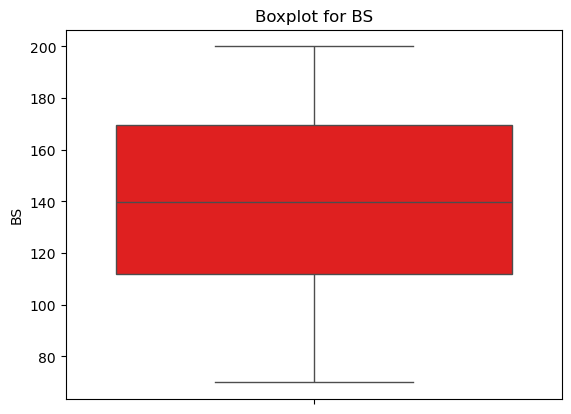

25% Quantile q1 = 111.9
75% Quantile q3 = 169.7
IQR = 57.79999999999998

--------------------------------------------------------------------------------
Lower Tail = 25.20000000000003
Upper Tail = 256.4
--------------------------------------------------------------------------------

Outliers :
 Empty DataFrame
Columns: [Age, SystolicBP, DiastolicBP, BS, BodyTemp, HeartRate, RiskLevel, Hemoglobin, BMI, Parity, SmokingStatus, PhysicalActivityLevel]
Index: []
--------------------------------------------------------------------------------
After handling of Outliers data:

    Age  SystolicBP  DiastolicBP     BS  BodyTemp  HeartRate  RiskLevel  \
0  31.0       130.6         86.3  119.1      98.0       99.4   mid risk   
1  35.0       152.2         93.4  187.0      98.0      118.6  high risk   
2  29.0       124.2         87.2  112.0     100.0       74.6   mid risk   
3  30.0       147.6         99.6  172.3      98.0      101.5  high risk   
4  35.0       127.9         83.7  111.1      98

In [47]:
Checking_and_Handling_Of_Outliers(df,'BS')

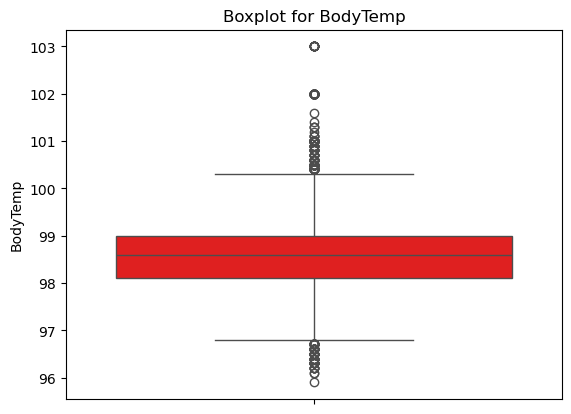

25% Quantile q1 = 98.1
75% Quantile q3 = 99.0
IQR = 0.9000000000000057

--------------------------------------------------------------------------------
Lower Tail = 96.74999999999999
Upper Tail = 100.35000000000001
--------------------------------------------------------------------------------

Outliers :
         Age  SystolicBP  DiastolicBP     BS  BodyTemp  HeartRate  RiskLevel  \
18     30.0       110.9         71.3   80.8     101.0       79.3   low risk   
35     12.0       135.9         84.3  118.4     102.0       60.6   mid risk   
66     17.0       138.1         88.1  106.4     102.0       78.3   mid risk   
69     32.0       114.6         76.8   98.9     101.0       67.6   low risk   
70     26.0        92.2         68.5   81.8     101.0       84.2   low risk   
...     ...         ...          ...    ...       ...        ...        ...   
29842  25.0       130.6         83.3  122.0      96.3       72.5   mid risk   
29860  39.0       144.9        102.1  133.0     100.4     

In [48]:
Checking_and_Handling_Of_Outliers(df,'BodyTemp')

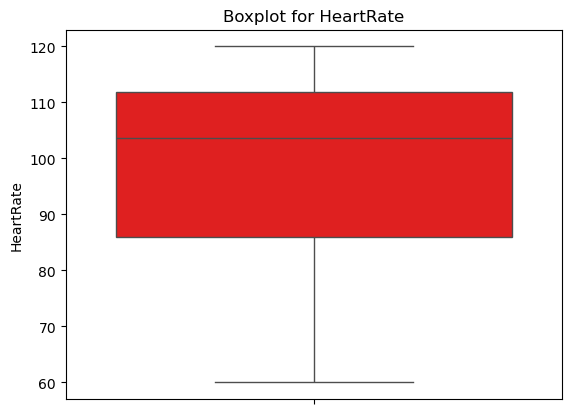

25% Quantile q1 = 85.9
75% Quantile q3 = 111.9
IQR = 26.0

--------------------------------------------------------------------------------
Lower Tail = 46.900000000000006
Upper Tail = 150.9
--------------------------------------------------------------------------------

Outliers :
 Empty DataFrame
Columns: [Age, SystolicBP, DiastolicBP, BS, BodyTemp, HeartRate, RiskLevel, Hemoglobin, BMI, Parity, SmokingStatus, PhysicalActivityLevel]
Index: []
--------------------------------------------------------------------------------
After handling of Outliers data:

    Age  SystolicBP  DiastolicBP     BS  BodyTemp  HeartRate  RiskLevel  \
0  31.0       130.6         86.3  119.1      98.0       99.4   mid risk   
1  35.0       152.2         93.4  187.0      98.0      118.6  high risk   
2  29.0       124.2         87.2  112.0     100.0       74.6   mid risk   
3  30.0       147.6         99.6  172.3      98.0      101.5  high risk   
4  35.0       127.9         83.7  111.1      98.0       66.8

In [49]:
Checking_and_Handling_Of_Outliers(df,'HeartRate')

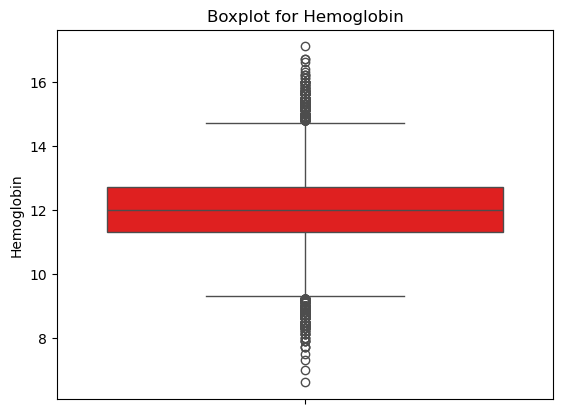

25% Quantile q1 = 11.3
75% Quantile q3 = 12.7
IQR = 1.3999999999999986

--------------------------------------------------------------------------------
Lower Tail = 9.200000000000003
Upper Tail = 14.799999999999997
--------------------------------------------------------------------------------

Outliers :
         Age  SystolicBP  DiastolicBP     BS  BodyTemp  HeartRate  RiskLevel  \
1374   33.0       117.4         72.0   86.0      98.1       96.4   low risk   
1384   30.0       125.8         84.1  105.3      98.4       83.5   mid risk   
1431   39.0       157.7         99.2  174.8      99.5      113.1  high risk   
1556   33.0       122.5         88.1  117.0      99.0       80.7   mid risk   
1606   29.0       168.7         99.4  147.4      98.1      104.2  high risk   
...     ...         ...          ...    ...       ...        ...        ...   
29814  34.0       134.3         87.4  118.5      99.6       98.7   mid risk   
29823  38.0       135.3         87.9  103.4      97.5     

In [50]:
Checking_and_Handling_Of_Outliers(df,'Hemoglobin')

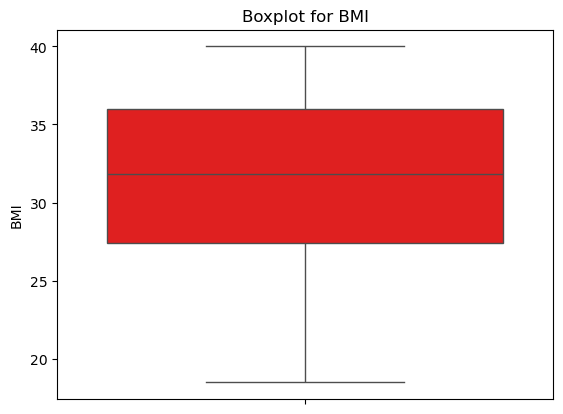

25% Quantile q1 = 27.4
75% Quantile q3 = 36.0
IQR = 8.600000000000001

--------------------------------------------------------------------------------
Lower Tail = 14.499999999999996
Upper Tail = 48.900000000000006
--------------------------------------------------------------------------------

Outliers :
 Empty DataFrame
Columns: [Age, SystolicBP, DiastolicBP, BS, BodyTemp, HeartRate, RiskLevel, Hemoglobin, BMI, Parity, SmokingStatus, PhysicalActivityLevel]
Index: []
--------------------------------------------------------------------------------
After handling of Outliers data:

    Age  SystolicBP  DiastolicBP     BS  BodyTemp  HeartRate  RiskLevel  \
0  31.0       130.6         86.3  119.1      98.0       99.4   mid risk   
1  35.0       152.2         93.4  187.0      98.0      118.6  high risk   
2  29.0       124.2         87.2  112.0     100.0       74.6   mid risk   
3  30.0       147.6         99.6  172.3      98.0      101.5  high risk   
4  35.0       127.9         83.7  1

In [51]:
Checking_and_Handling_Of_Outliers(df,'BMI')

## analysis of Categorical columns

In [53]:
# create a function for calculate analysis of categorical columns
def analyze_categorical(data, column):
    # Frequency distribution
    f = data[column].value_counts()
    p = data[column].value_counts(normalize=True) * 100

    # Combine frequency and percentage
    analysis = pd.DataFrame({"Frequency": f, "Percentage": p})
    print(f"Analysis of {column}:")
    print(analysis)

    # Bar plot
    f.plot(kind="bar")
    plt.title(f"Frequency Distribution of {column}")
    plt.xlabel(column)
    plt.show()

    # Pie chart
    p.plot(kind="pie", autopct="%.1f%%")
    plt.title(f"Percentage Distribution of {column}")
    plt.show()


Analysis of RiskLevel:
           Frequency  Percentage
RiskLevel                       
high risk      18447   61.490000
mid risk        7813   26.043333
low risk        3740   12.466667


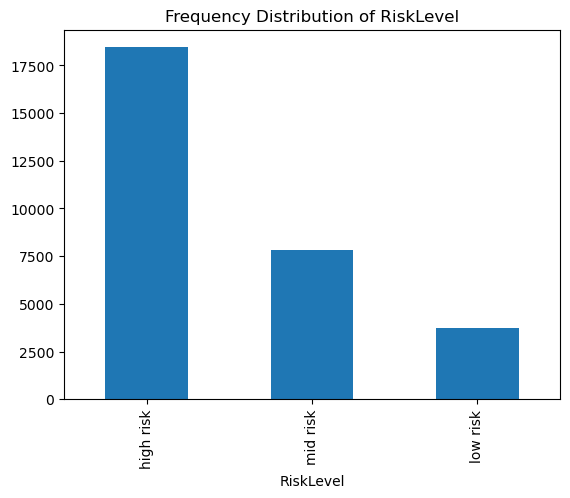

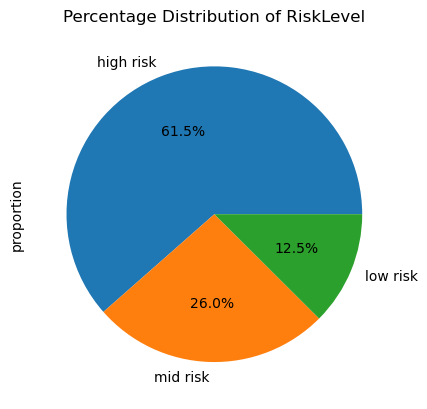

In [54]:
analyze_categorical(df,'RiskLevel')

Analysis of Parity:
        Frequency  Percentage
Parity                       
2.0          7994   26.646667
3.0          5547   18.490000
1.0          5527   18.423333
0.0          5493   18.310000
4.0          5439   18.130000


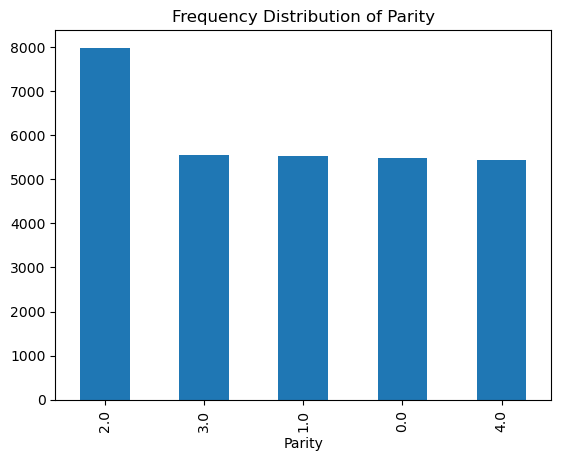

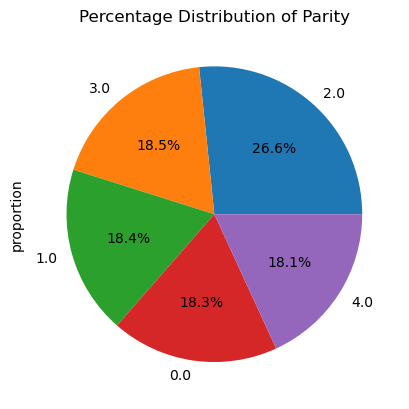

In [55]:
analyze_categorical(df,'Parity')

Analysis of SmokingStatus:
               Frequency  Percentage
SmokingStatus                       
No                 21695   72.316667
Yes                 8305   27.683333


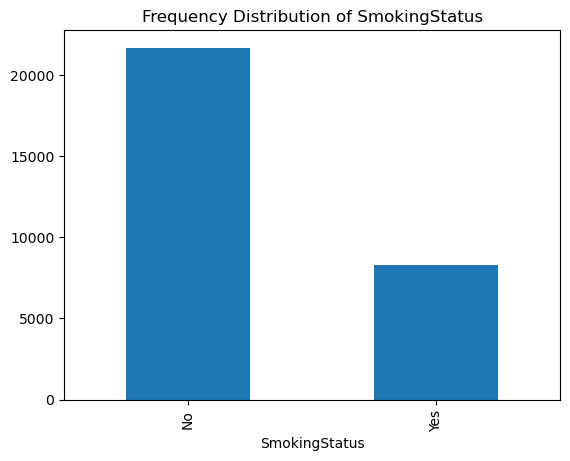

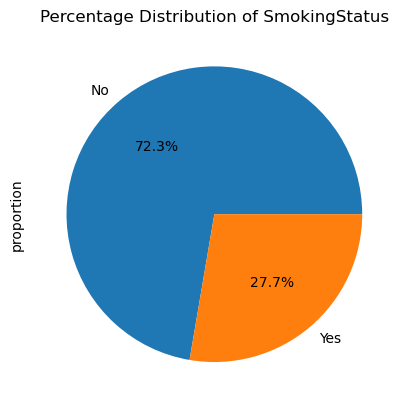

In [56]:
analyze_categorical(df,'SmokingStatus')

Analysis of PhysicalActivityLevel:
                       Frequency  Percentage
PhysicalActivityLevel                       
Moderate                   12344   41.146667
Low                        12175   40.583333
High                        5481   18.270000


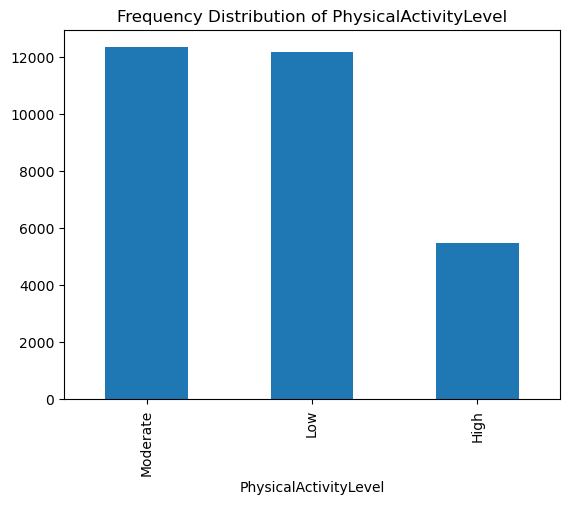

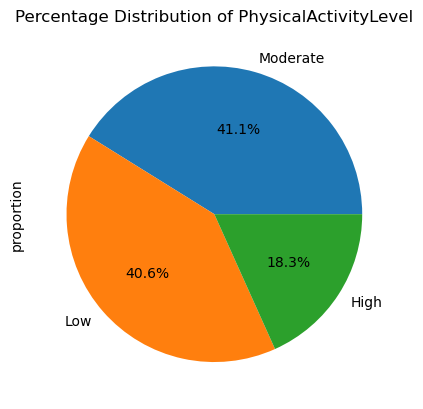

In [57]:
analyze_categorical(df,'PhysicalActivityLevel')

## More Univariate Analysis:

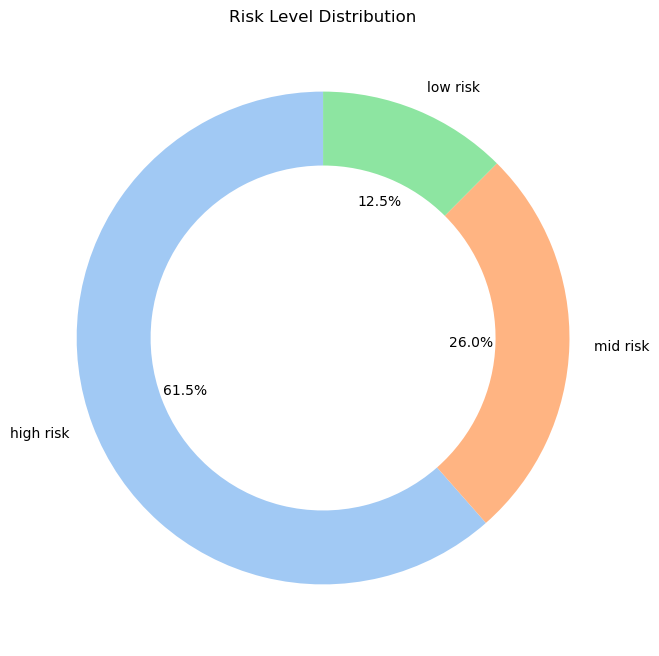

In [59]:
# Donut chart for RiskLevel distribution
plt.figure(figsize=(8, 8))
sizes = df['RiskLevel'].value_counts()
labels = sizes.index
colors = sns.color_palette("pastel")
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.3))
plt.title('Risk Level Distribution')
plt.show()

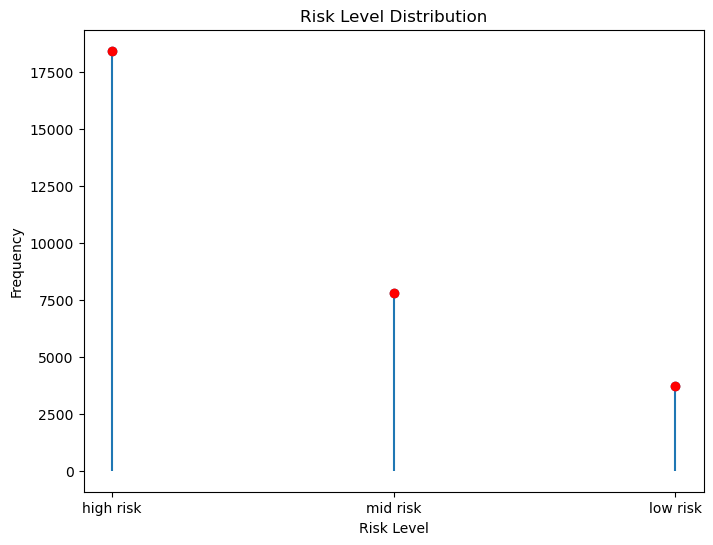

In [60]:
counts = df['RiskLevel'].value_counts()
plt.figure(figsize=(8, 6))
plt.stem(counts.index, counts.values, basefmt=" ")  # Removed use_line_collection
plt.scatter(counts.index, counts.values, color='red', zorder=5)
plt.title('Risk Level Distribution')
plt.xlabel('Risk Level')
plt.ylabel('Frequency')
plt.show()

## Bivariate Analysis of Columns

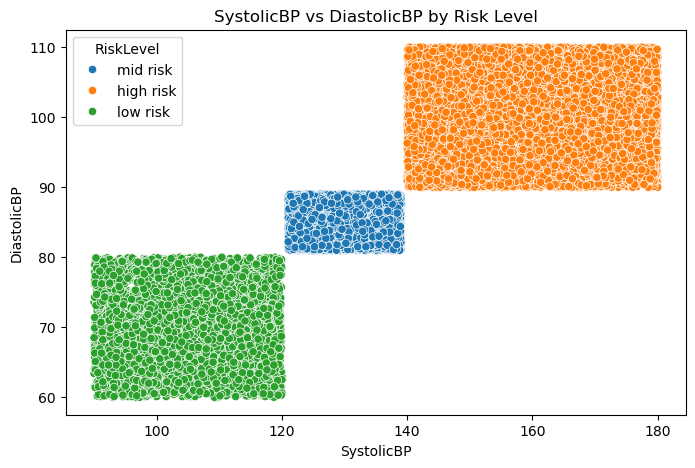

In [62]:
# Scatter plot for numerical variables
plt.figure(figsize=(8, 5))
sns.scatterplot(x='SystolicBP', y='DiastolicBP', data=df, hue='RiskLevel')
plt.title('SystolicBP vs DiastolicBP by Risk Level')
plt.xlabel('SystolicBP')
plt.ylabel('DiastolicBP')
plt.show()

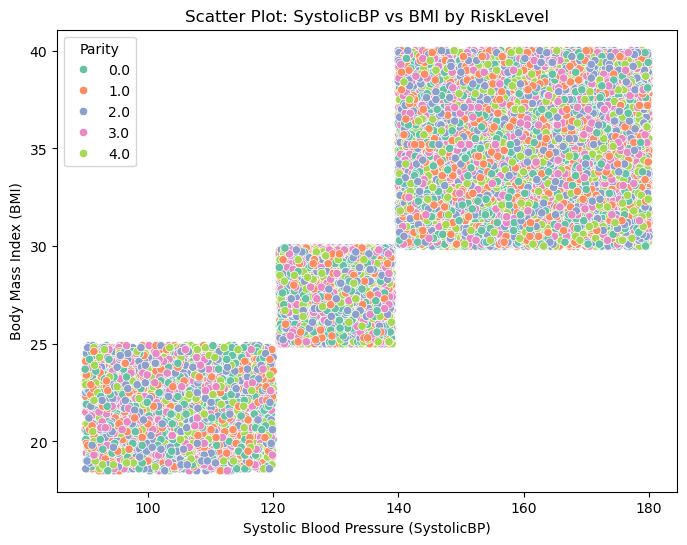

In [63]:
# Scatter Plot: Relationship between SystolicBP and BMI, grouped by Parity
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='SystolicBP', y='BMI', hue='Parity', palette='Set2')
plt.title('Scatter Plot: SystolicBP vs BMI by RiskLevel')
plt.xlabel('Systolic Blood Pressure (SystolicBP)')
plt.ylabel('Body Mass Index (BMI)')
plt.show()

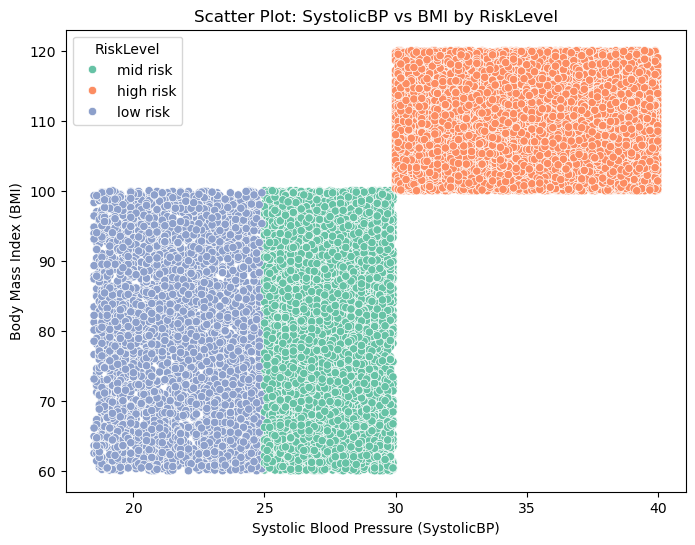

In [64]:
# Scatter Plot: Relationship between BMI and HeartRate, grouped by RiskLevel
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='BMI', y='HeartRate', hue='RiskLevel', palette='Set2')
plt.title('Scatter Plot: SystolicBP vs BMI by RiskLevel')
plt.xlabel('Systolic Blood Pressure (SystolicBP)')
plt.ylabel('Body Mass Index (BMI)')
plt.show()

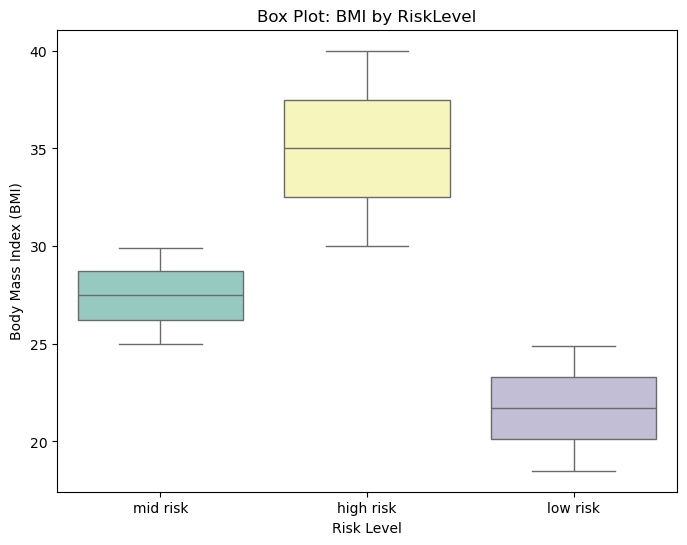

In [65]:
# Box Plot: Distribution of BMI across different RiskLevels
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='RiskLevel', y='BMI', palette='Set3')
plt.title('Box Plot: BMI by RiskLevel')
plt.xlabel('Risk Level')
plt.ylabel('Body Mass Index (BMI)')
plt.show()

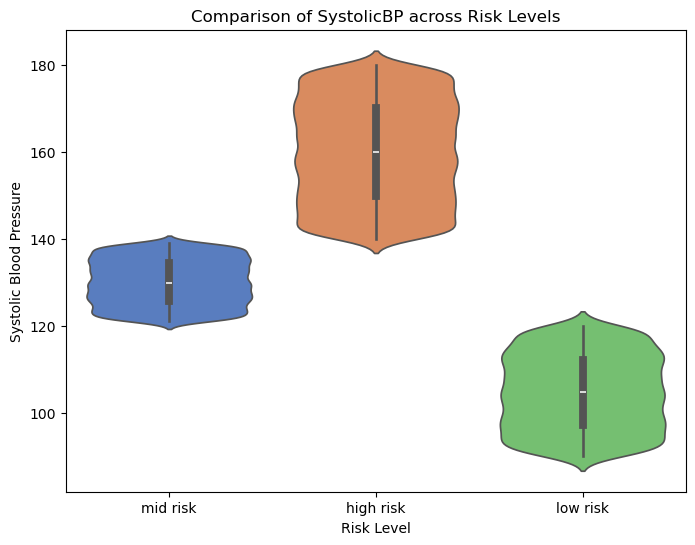

In [66]:
plt.figure(figsize=(8, 6))
sns.violinplot(data=df, x="RiskLevel", y="SystolicBP", palette="muted")
plt.title("Comparison of SystolicBP across Risk Levels")
plt.xlabel("Risk Level")
plt.ylabel("Systolic Blood Pressure")
plt.show()

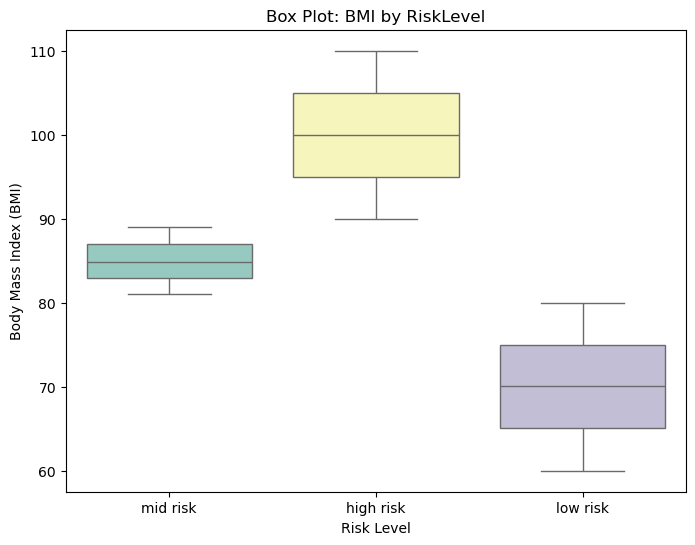

In [67]:
# Box Plot: Distribution of BMI across different RiskLevels
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='RiskLevel', y='DiastolicBP', palette='Set3')
plt.title('Box Plot: BMI by RiskLevel')
plt.xlabel('Risk Level')
plt.ylabel('Body Mass Index (BMI)')
plt.show()

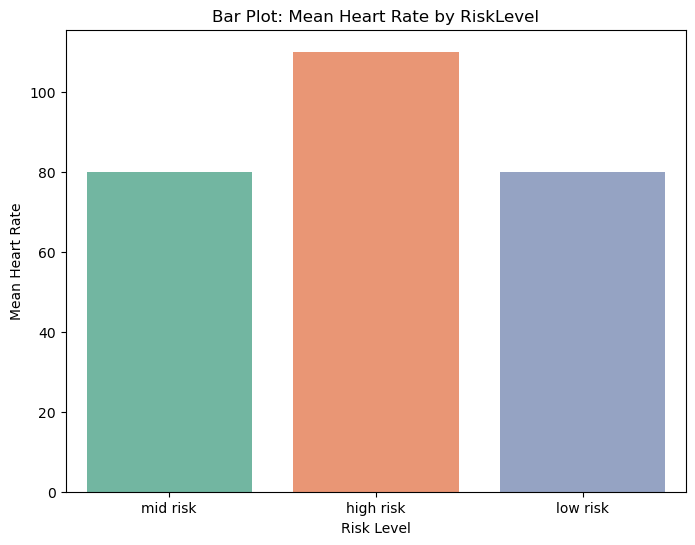

In [68]:
# Bar Plot: Mean Heart Rate for each RiskLevel
plt.figure(figsize=(8, 6))
sns.barplot(data=df, x='RiskLevel', y='HeartRate', palette='Set2', ci=None)
plt.title('Bar Plot: Mean Heart Rate by RiskLevel')
plt.xlabel('Risk Level')
plt.ylabel('Mean Heart Rate')
plt.show()

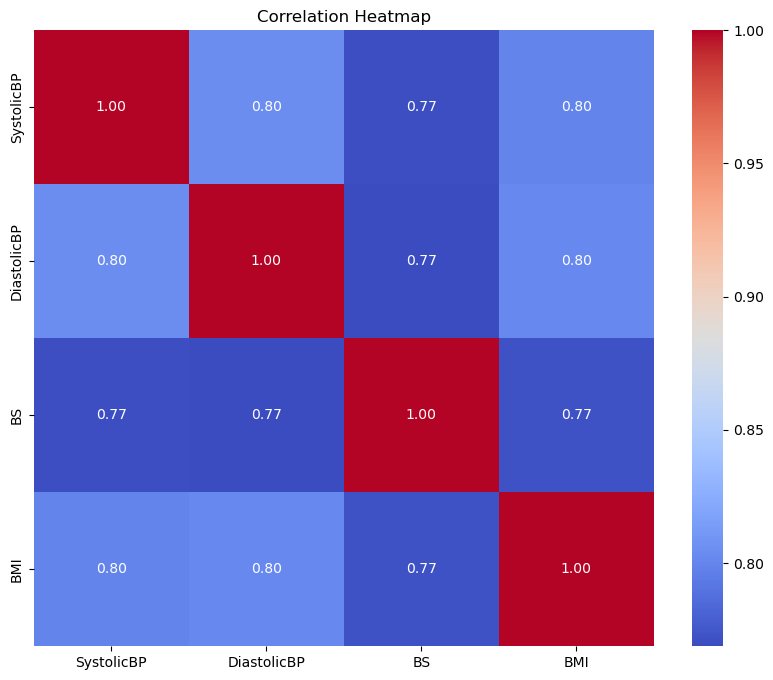

In [69]:
# Heatmap: Correlation between key numerical columns
plt.figure(figsize=(10, 8))
corr = df[['SystolicBP', 'DiastolicBP', 'BS', 'BMI']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

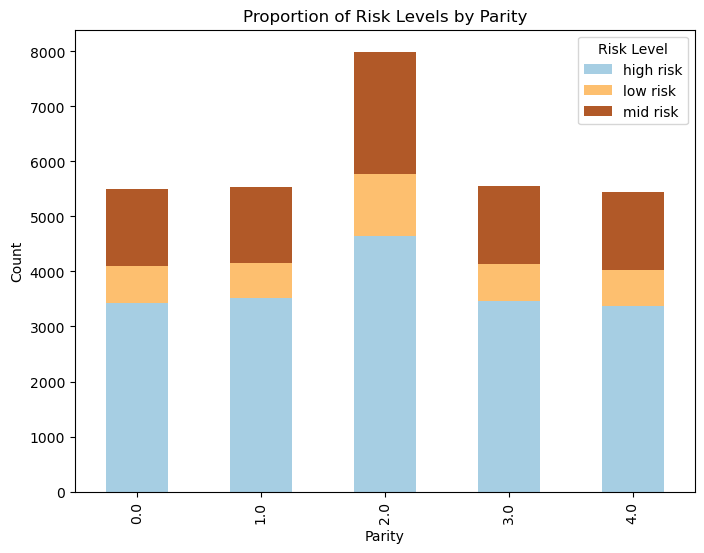

In [70]:
# Stacked bar chart for RiskLevel vs SmokingStatus
stacked_data = df.groupby(['Parity', 'RiskLevel']).size().unstack()
stacked_data.plot(kind='bar', stacked=True, figsize=(8, 6), colormap='Paired')
plt.title('Proportion of Risk Levels by Parity')
plt.xlabel('Parity')
plt.ylabel('Count')
plt.legend(title='Risk Level')
plt.show()

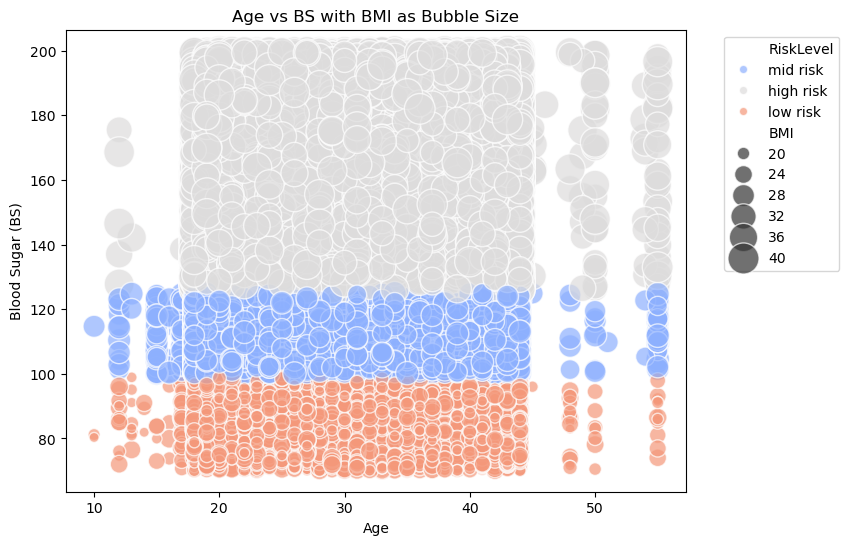

In [71]:
# Bubble chart for Age vs BS, size by BMI, colored by RiskLevel
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Age', y='BS', size='BMI', hue='RiskLevel', data=df, palette='coolwarm', alpha=0.7, sizes=(50, 500))
plt.title('Age vs BS with BMI as Bubble Size')
plt.xlabel('Age')
plt.ylabel('Blood Sugar (BS)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [72]:
import plotly.express as px
# Sunburst chart for hierarchical analysis
fig = px.sunburst(df, path=['RiskLevel', 'SmokingStatus'], values='BMI',
                  color='RiskLevel', color_discrete_map={'high risk':'red', 'mid risk':'orange', 'low risk':'green'},
                  title='Risk Level and Smoking Status Breakdown')
fig.show()

<Figure size 1200x800 with 0 Axes>

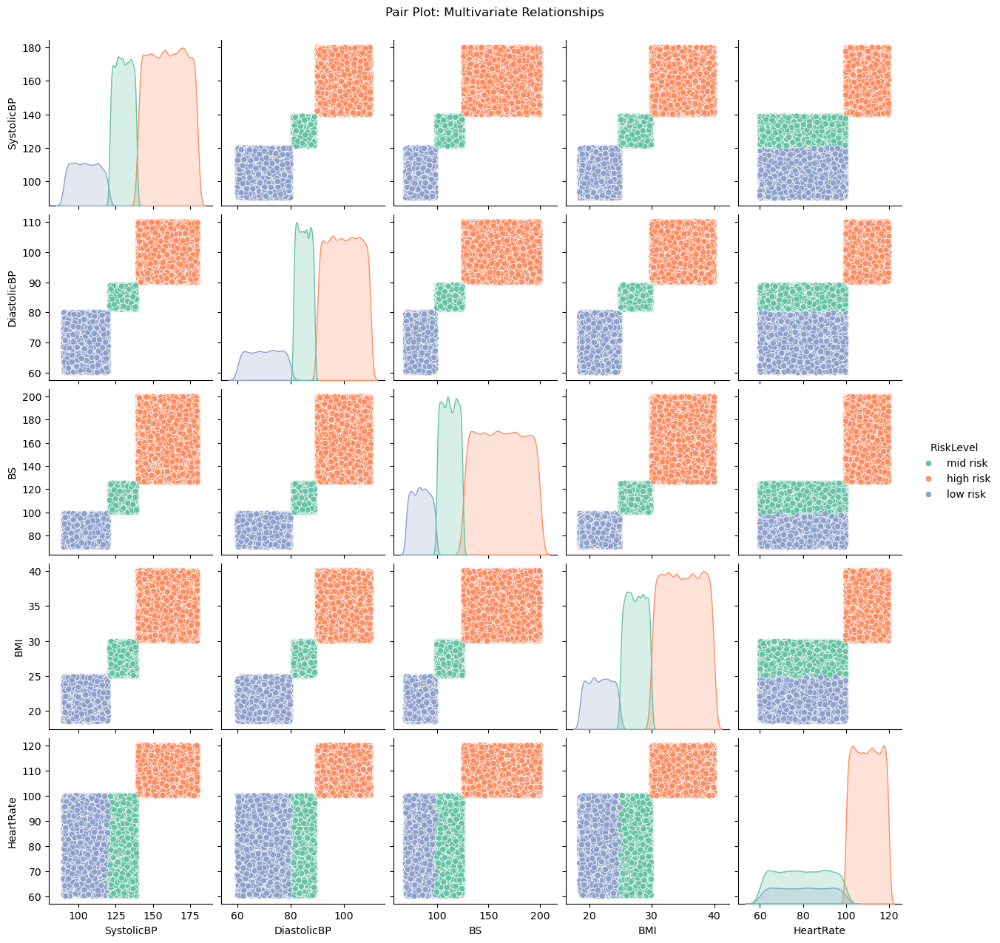

In [73]:
#Pair Plot: Relationships between multiple numerical columns, colored by RiskLevel
plt.figure(figsize=(12, 8))
sns.pairplot(
    df,
    vars=['SystolicBP', 'DiastolicBP', 'BS', 'BMI', 'HeartRate'],
    hue='RiskLevel',
    palette='Set2'
)
plt.suptitle('Pair Plot: Multivariate Relationships', y=1.02)
plt.show()

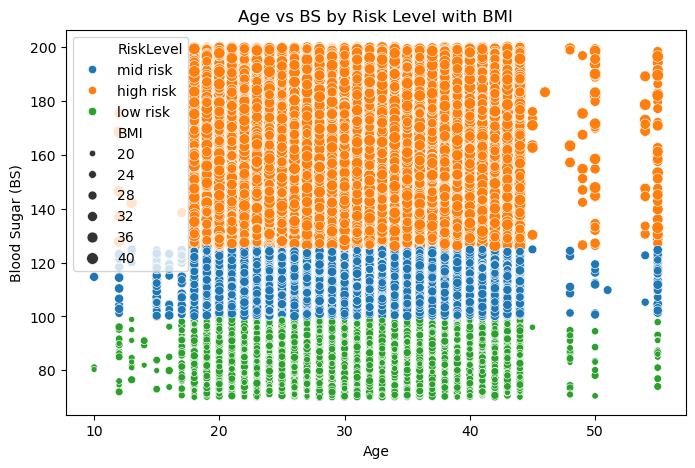

In [74]:
#  scatter plot
plt.figure(figsize=(8, 5))
sns.scatterplot(x='Age', y='BS', hue='RiskLevel', size='BMI', data=df)
plt.title('Age vs BS by Risk Level with BMI')
plt.xlabel('Age')
plt.ylabel('Blood Sugar (BS)')
plt.show()

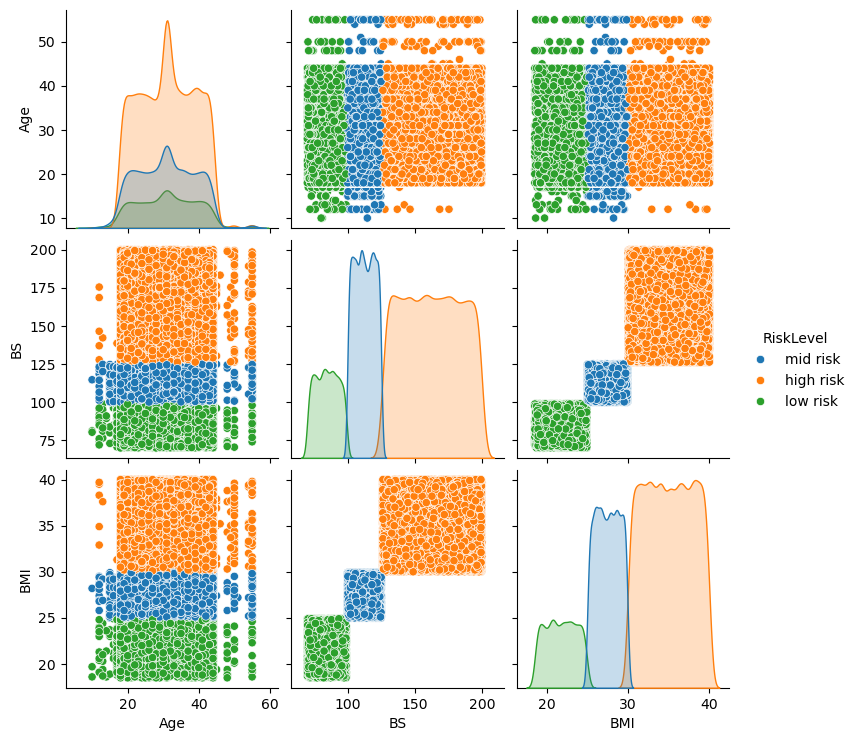

In [75]:
# Pair plot with categorical hue
sns.pairplot(df, vars=['Age', 'BS', 'BMI'], hue='RiskLevel', height=2.5)
plt.show()

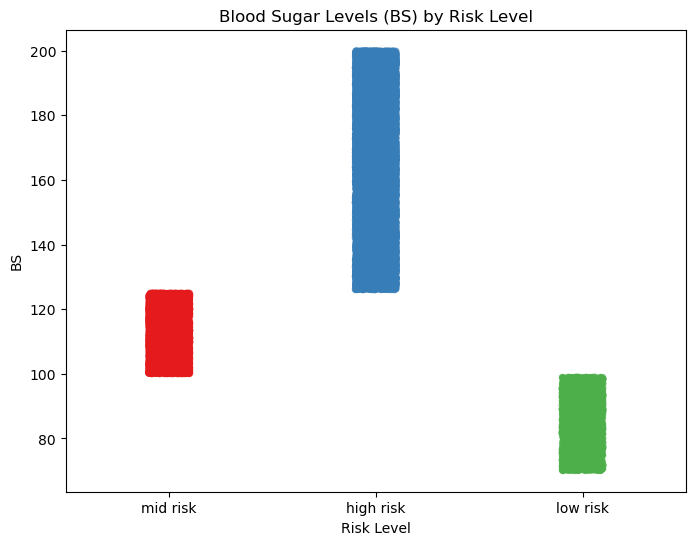

In [76]:
# Strip plot for BS distribution by RiskLevel
plt.figure(figsize=(8, 6))
sns.stripplot(x='RiskLevel', y='BS', data=df, jitter=True, alpha=0.6, palette='Set1')
plt.title('Blood Sugar Levels (BS) by Risk Level')
plt.xlabel('Risk Level')
plt.ylabel('BS')
plt.show()

## Feature Engineering 

In [78]:
df['RiskLevel']=df['RiskLevel'].replace({'mid risk':1, 'high risk':2, 'low risk':0})

In [79]:
df['SmokingStatus']=df['SmokingStatus'].replace({'No':0, 'Yes':1})

In [80]:
df['PhysicalActivityLevel']=df['PhysicalActivityLevel'].replace({'Moderate':1, 'Low':0, 'High':2})

###  Assumption1 : No Multicolinearity

In [82]:
X =df.drop(columns=['RiskLevel'])
y=df['RiskLevel']

In [83]:
# create onr dataframe in that add column Independent feature
vif_df = pd.DataFrame()
vif_df["Independant Feature"] = X.columns

In [84]:
# calculate VIF and add column VIF in Dataframe
a = X.shape[1]
vif_list = []
for i in range(a):
    vif = variance_inflation_factor(X.to_numpy(), i)
    vif_list.append(vif)
vif_df["VIF"] = vif_list 
vif_df
##column values is >10 but can't delete any column because all columns are important 

,Independant Feature,VIF
0,Age,16.850604
1,SystolicBP,169.518303
2,DiastolicBP,243.657349
3,BS,57.708357
4,BodyTemp,208.002651
5,HeartRate,91.496083
6,Hemoglobin,111.194481
7,BMI,132.875671
8,Parity,3.183326
9,SmokingStatus,1.439474


## train test split

In [86]:
xtrain,xtest,ytrain,ytest = train_test_split(X,y,test_size=0.2,random_state=10)

## model training

### Algorithm1 : Logistic Regression

In [89]:
# Logistic Regression
LR = LogisticRegression(multi_class="ovr")
LR_model=LR.fit(xtrain, ytrain)

In [90]:
# training Data

Accuracy = 1.0
Logistic Regression Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



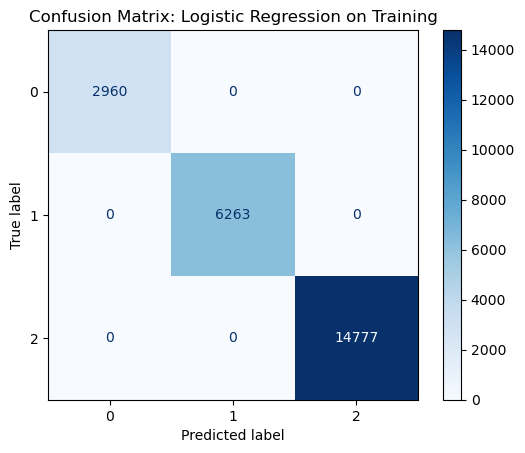

In [91]:
# Predictions
ytrain_pred = LR_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("Logistic Regression Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: Logistic Regression on Training")
plt.show()

In [92]:
#Testing Data

Accuracy = 1.0
Logistic Regression Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



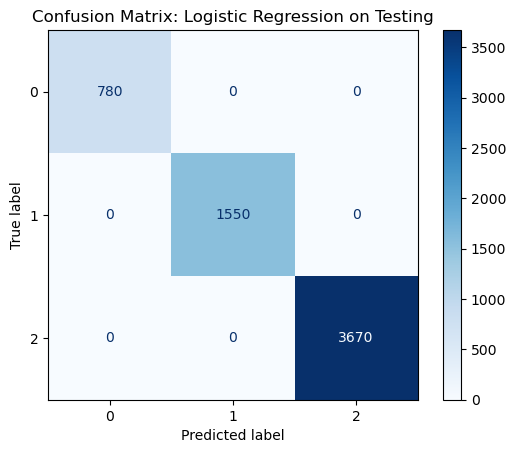

In [93]:
# Predictions
ytest_pred = LR_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("Logistic Regression Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: Logistic Regression on Testing")
plt.show()

### Algorithm 2 :Decision Tree Classifier

In [95]:
# Decision Tree Classifier
DT = DecisionTreeClassifier(ccp_alpha=0.0)
DT_model=DT.fit(xtrain, ytrain)
DT_model

DecisionTreeClassifier()

In [96]:
# training Data

Accuracy = 1.0
Decision Tree Classifier Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



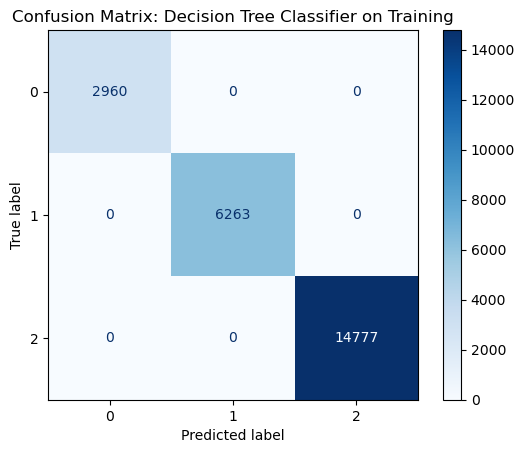

In [97]:
# Predictions
ytrain_pred = DT_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("Decision Tree Classifier Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: Decision Tree Classifier on Training")
plt.show()

In [98]:
#Testing Data

Accuracy = 1.0
Decision Tree Classifier Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



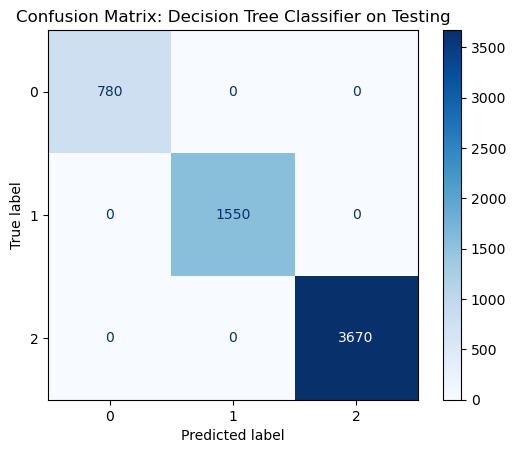

In [99]:
# Predictions
ytest_pred = DT_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("Decision Tree Classifier Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: Decision Tree Classifier on Testing")
plt.show()

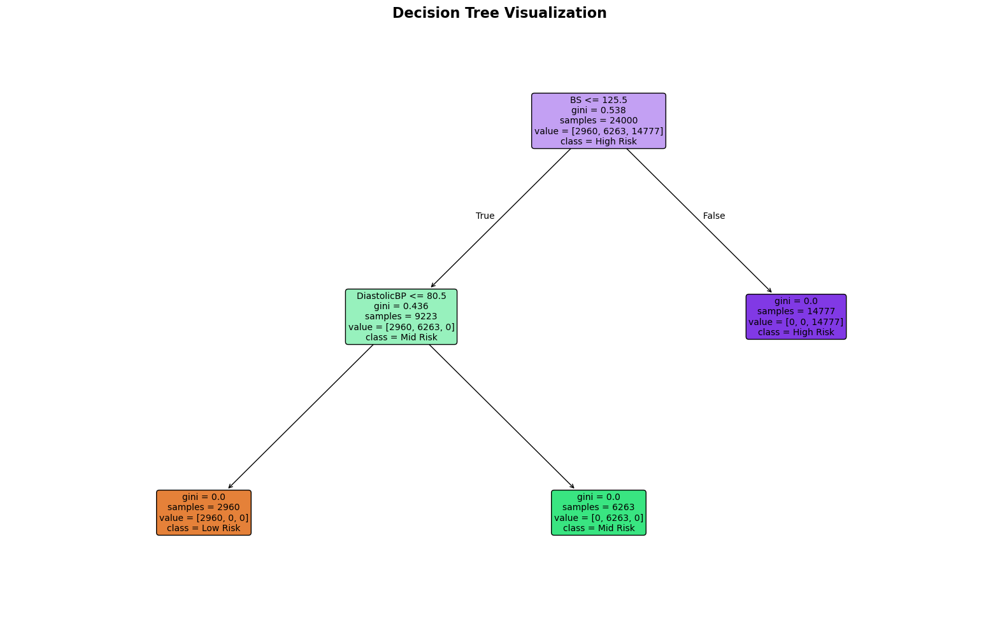

In [100]:
# Adjusting the size and readability of the plot
plt.figure(figsize=(20, 12))  # Larger figure for better visualization
plot_tree(
    DT_model, 
    feature_names=X.columns, 
    class_names=["Low Risk", "Mid Risk", "High Risk"],  # Use meaningful class names
    filled=True, 
    rounded=True,  # Rounded nodes for better aesthetics
    fontsize=10  # Adjusted font size for readability
)
plt.title("Decision Tree Visualization", fontsize=16, weight="bold")  # Add a title to the plot
plt.show()

## Decision tree Classifier with hyperparameter tunning

In [102]:
hyperparameters = {"criterion" : ["gini","entropy","log_loss"],
                  "max_depth" : np.arange(2,11),
                  "min_samples_split" : np.arange(2,11),
                  "min_samples_leaf" : np.arange(2, 12) }

In [103]:
rscv_dt = RandomizedSearchCV(DT_model, hyperparameters, cv=5)
rscv_dt = rscv_dt.fit(xtrain,ytrain)
rscv_dt

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'min_samples_leaf': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10])})

In [104]:
rscv_dt.best_estimator_

DecisionTreeClassifier(max_depth=2, min_samples_leaf=7, min_samples_split=8)

In [105]:
rscv_dt = DecisionTreeClassifier(max_depth=8, min_samples_leaf=10, min_samples_split=13)
rscv_dt

DecisionTreeClassifier(max_depth=8, min_samples_leaf=10, min_samples_split=13)

In [106]:
rscv_DT_model = rscv_dt.fit(xtrain,ytrain)
rscv_DT_model

DecisionTreeClassifier(max_depth=8, min_samples_leaf=10, min_samples_split=13)

In [107]:
#Training Data

Accuracy = 1.0
Decision tree Classifier with hyperparameter Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



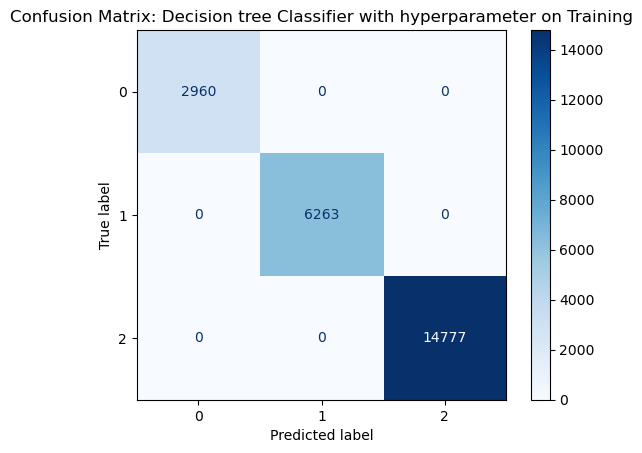

In [108]:
# Predictions
ytrain_pred = rscv_DT_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("Decision tree Classifier with hyperparameter Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: Decision tree Classifier with hyperparameter on Training")
plt.show()

In [109]:
# Testing Data

Accuracy = 1.0
Decision tree Classifier with hyperparameter Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



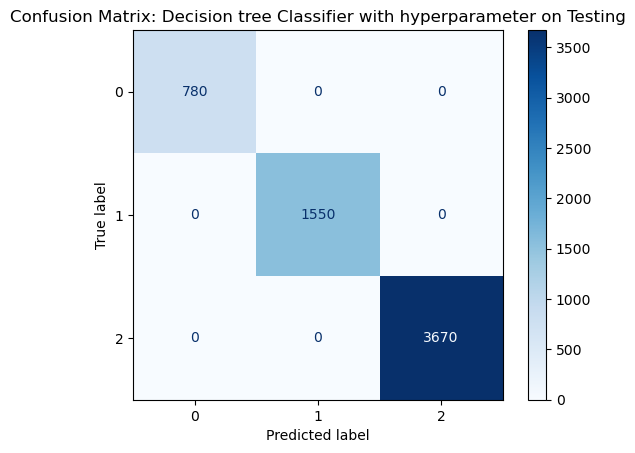

In [110]:
# Predictions
ytest_pred = rscv_DT_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("Decision tree Classifier with hyperparameter Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: Decision tree Classifier with hyperparameter on Testing")
plt.show()

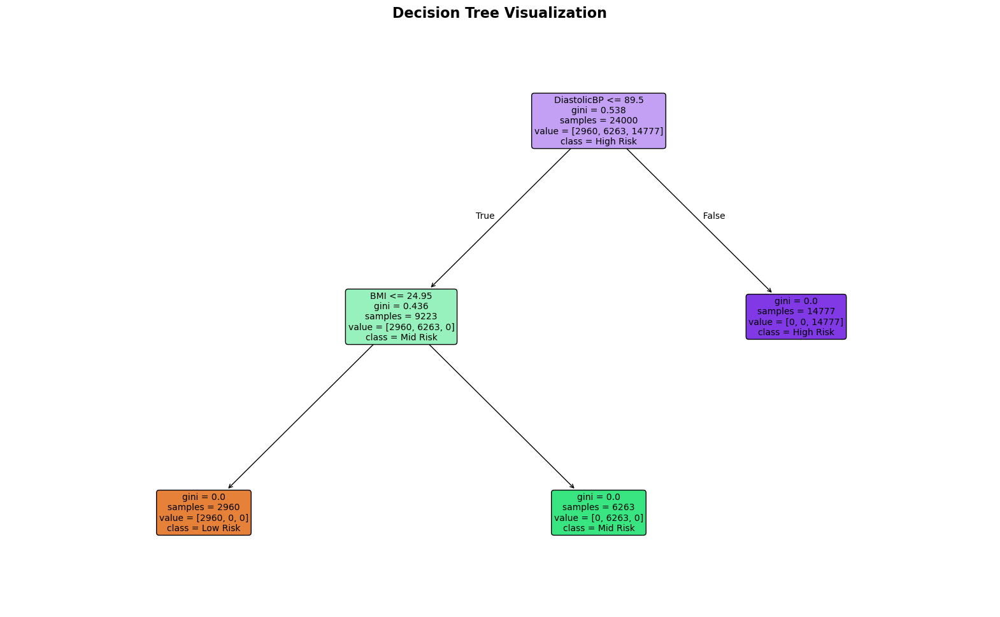

Figure saved as 'decision_tree_visualization.png'


In [111]:
# Adjusting the size and readability of the plot
plt.figure(figsize=(20, 12))  # Larger figure for better visualization
plot_tree(
    rscv_DT_model, 
    feature_names=X.columns, 
    class_names=["Low Risk", "Mid Risk", "High Risk"],  # Use meaningful class names
    filled=True, 
    rounded=True,  # Rounded nodes for better aesthetics
    fontsize=10  # Adjusted font size for readability
)
plt.title("Decision Tree Visualization", fontsize=16, weight="bold")  # Add a title to the plot

# Save the figure before showing it
plt.savefig("decision_tree_visualization.png", dpi=300, bbox_inches='tight')

plt.show()

print("Figure saved as 'decision_tree_visualization.png'")


### Best features by feature importance

In [113]:
feature_imporatance_df = pd.DataFrame(rscv_DT_model.feature_importances_)
feature_imporatance_df

,0
0,0.000000
1,0.000000
2,0.688422
3,0.000000
4,0.000000
5,0.000000
6,0.000000
7,0.311578
8,0.000000
9,0.000000


In [114]:
feature_imporatance_df["Features"] = X.columns

In [115]:
feature_imporatance_df.rename({0:"Value"}, axis = 1, inplace=True)
feature_imporatance_df

,Value,Features
0,0.000000,Age
1,0.000000,SystolicBP
2,0.688422,DiastolicBP
3,0.000000,BS
4,0.000000,BodyTemp
5,0.000000,HeartRate
6,0.000000,Hemoglobin
7,0.311578,BMI
8,0.000000,Parity
9,0.000000,SmokingStatus


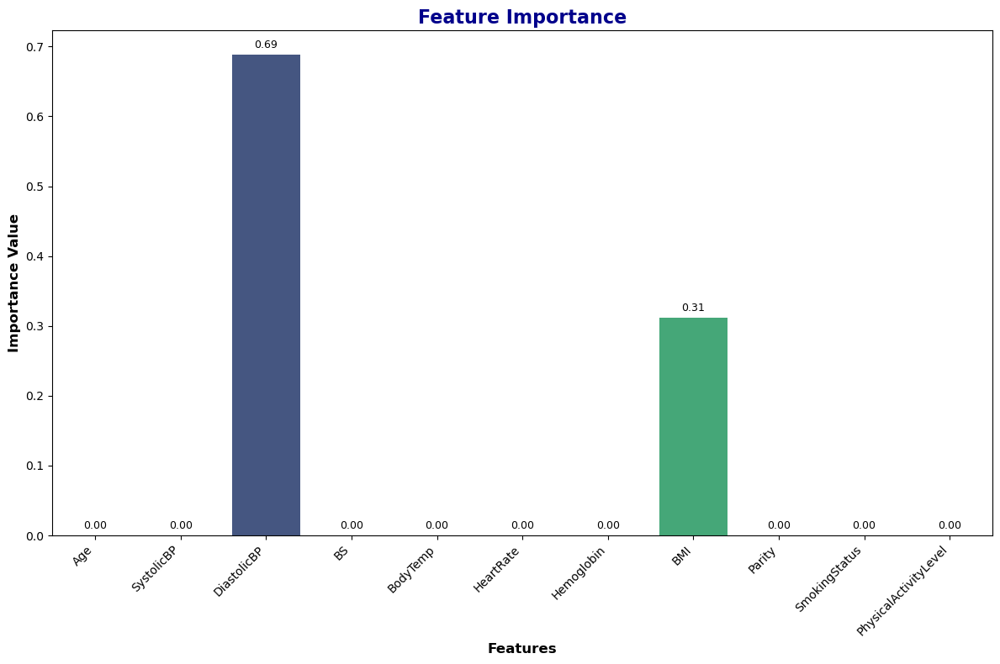

In [116]:
plt.figure(figsize=(12, 8))  # Increase figure size for better visibility
sns.barplot(
    x=feature_imporatance_df["Features"], 
    y=feature_imporatance_df["Value"], 
    palette="viridis"  # Use a vibrant color palette
)
plt.title("Feature Importance", fontsize=16, weight="bold", color="darkblue")  # Add a title
plt.xlabel("Features", fontsize=12, weight="bold")  # Label for x-axis
plt.ylabel("Importance Value", fontsize=12, weight="bold")  # Label for y-axis
plt.xticks(rotation=45, ha="right", fontsize=10)  # Rotate x-axis labels for better readability

# Annotate the bars with their values
for i, v in enumerate(feature_imporatance_df["Value"]):
    plt.text(i, v + 0.01, f"{v:.2f}", ha="center", fontsize=9, color="black")

plt.tight_layout()  # Adjust layout to avoid clipping
plt.show()


### Algorithm 3 :Random Forest

In [118]:
RF = RandomForestClassifier()
RF

RandomForestClassifier()

In [119]:
RF_model = RF.fit(xtrain,ytrain)
RF_model

RandomForestClassifier()

In [120]:
# Training data

Accuracy = 1.0
Random Forest Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



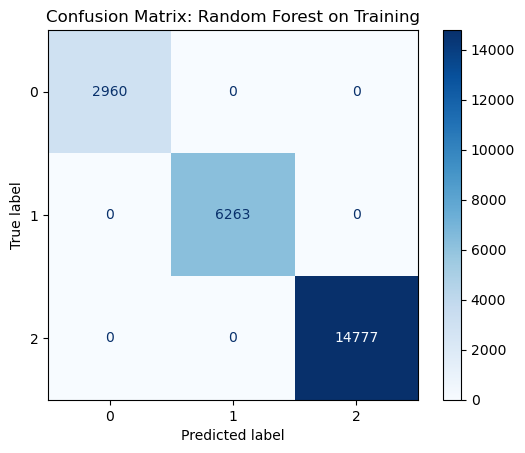

In [121]:
# Predictions
ytrain_pred = RF_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("Random Forest Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: Random Forest on Training")
plt.show()

In [122]:
# Testing Data

Accuracy = 1.0
Random Forest Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



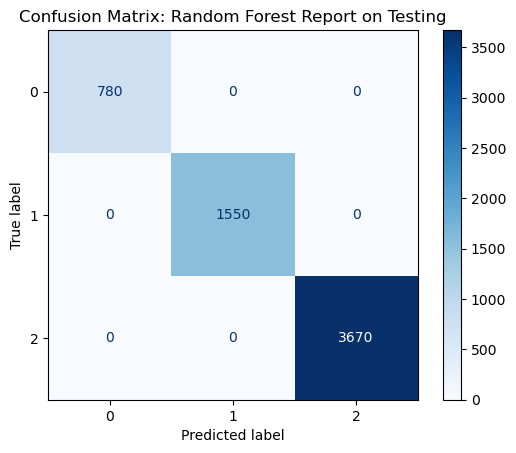

In [123]:
# Predictions
ytest_pred = RF_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("Random Forest Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: Random Forest Report on Testing")
plt.show()

### Randomforest with hyperparameter tunning

In [125]:
hyperparameter1 = {"criterion" : ["gini","entropy","log_loss"],
       "max_depth" : np.arange(2,11),
       "min_samples_split" : np.arange(2,11),
       "min_samples_leaf" : np.arange(2, 12),
       "n_estimators" : np.arange(10, 101)
}

In [126]:
rscv_rf = RandomizedSearchCV(RF_model, hyperparameter1, cv = 5)
rscv_RF_model = rscv_rf.fit(xtrain, ytrain)
rscv_RF_model.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=3, min_samples_leaf=3,
                       min_samples_split=10, n_estimators=26)

In [127]:
#Training Data

Accuracy = 1.0
Randomforest with hyperparameter Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



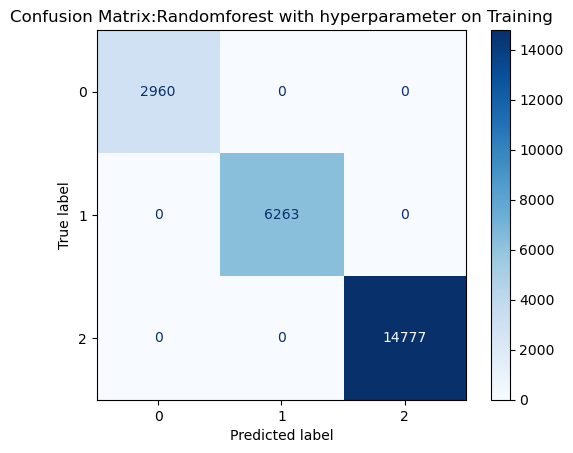

In [128]:
# Predictions
ytrain_pred = rscv_RF_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("Randomforest with hyperparameter Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:Randomforest with hyperparameter on Training")
plt.show()

In [129]:
#Testing Data

Accuracy = 1.0
Randomforest with hyperparameter Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



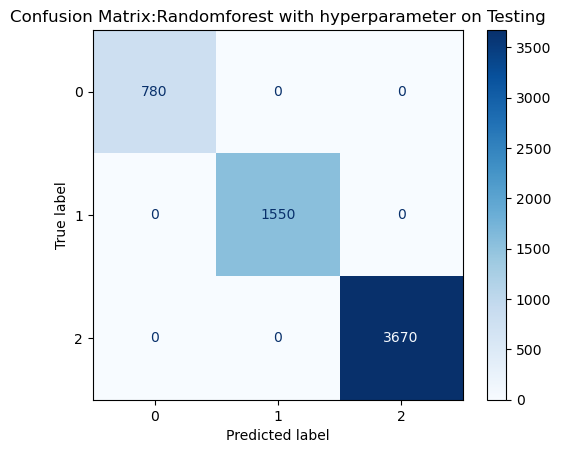

In [130]:
# Predictions
ytest_pred = rscv_RF_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("Randomforest with hyperparameter Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:Randomforest with hyperparameter on Testing")
plt.show()

## Algorithm 4 : AdaBoost Algorithm 

In [132]:
# Create an AdaBoost classifier for multiclass classification
adaboost = AdaBoostClassifier()
adaboost

AdaBoostClassifier()

In [133]:
adaboost_model=adaboost.fit(xtrain, ytrain)
adaboost_model

AdaBoostClassifier()

In [134]:
# Training Data

Accuracy = 1.0
AdaBoost Algorithm Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



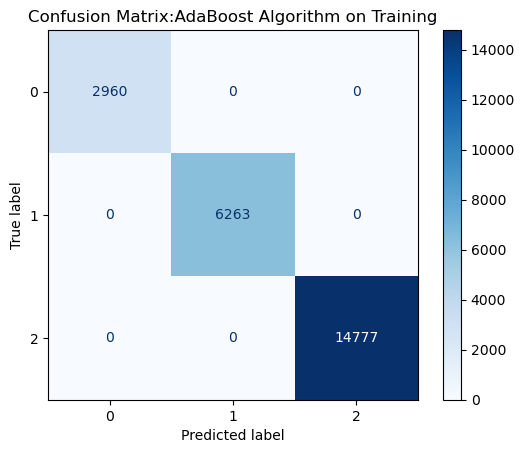

In [135]:
# Predictions
ytrain_pred = adaboost_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("AdaBoost Algorithm Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:AdaBoost Algorithm on Training")
plt.show()

In [136]:
# Testing Data

Accuracy = 1.0
AdaBoost Algorithm Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



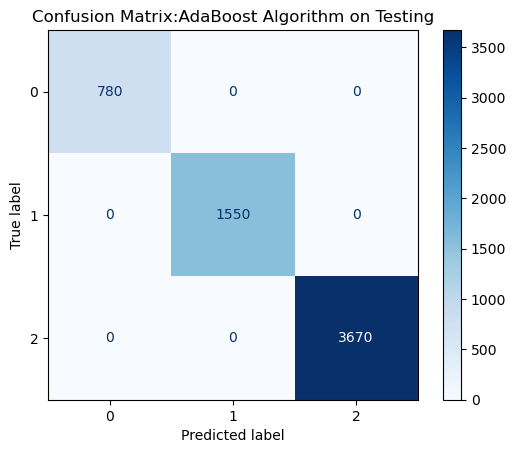

In [137]:
# Predictions
ytest_pred = adaboost_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("AdaBoost Algorithm Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:AdaBoost Algorithm on Testing")
plt.show()

Number of weak learners: 50


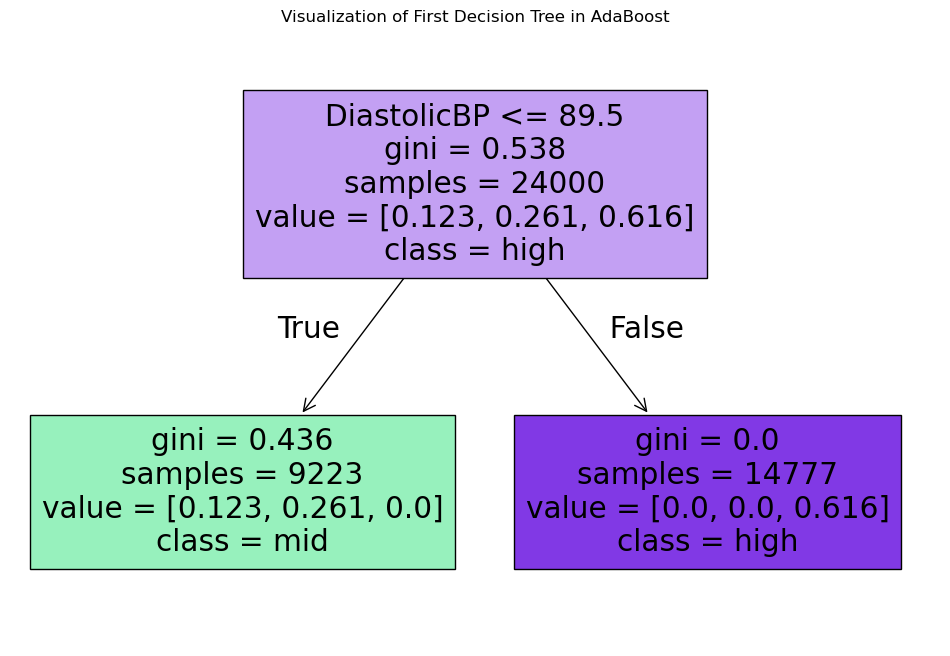

Figure saved as 'first_decision_tree_adaboost.png'


In [138]:
# Check the number of weak learners
print("Number of weak learners:", len(adaboost.estimators_))

# Access and plot the first tree if available
if len(adaboost.estimators_) > 0:
    first_tree = adaboost.estimators_[0]
    plt.figure(figsize=(12, 8))
    plot_tree(
        first_tree,
        feature_names=X.columns.tolist(),  # Pass the updated feature names
        class_names=['low', 'mid', 'high'],  # Class names for target labels
        filled=True
    )
    plt.title("Visualization of First Decision Tree in AdaBoost")

    # Save the figure before showing it
    plt.savefig("first_decision_tree_adaboost.png", dpi=300, bbox_inches='tight')

    plt.show()
    print("Figure saved as 'first_decision_tree_adaboost.png'")
else:
    print("No weak learners were created. Check the dataset or AdaBoost configuration.")

## Adaboost with HyperParameters 

In [140]:
# Create an AdaBoost classifier with hyperparameters
adaboost_hyp = AdaBoostClassifier()

In [141]:
# Define the base estimator
base_estimator = DecisionTreeClassifier()

In [142]:
param_dist = {
    'n_estimators': np.arange(50, 301, 50),     # Number of estimators
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 1], # Learning rate
}

In [143]:
# Perform the randomized search
random = RandomizedSearchCV(
    estimator=adaboost,
    param_distributions=param_dist,
    cv=5,                          
)

In [144]:
# Fit the model
adaboost_hyp_model=random.fit(xtrain, ytrain)
adaboost_hyp_model

RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(),
                   param_distributions={'learning_rate': [0.01, 0.05, 0.1, 0.2,
                                                          1],
                                        'n_estimators': array([ 50, 100, 150, 200, 250, 300])})

In [145]:
# Display the best parameters found by RandomizedSearchCV
print("Best Hyperparameters:", adaboost_hyp_model.best_params_)

Best Hyperparameters: {'n_estimators': 50, 'learning_rate': 0.05}


In [146]:
# Define the AdaBoostClassifier
adaboost = AdaBoostClassifier(
    estimator=base_estimator, 
    n_estimators=200, 
    learning_rate=0.05
)

In [147]:
# Fit the model
adaboost_hyp_model0 = adaboost.fit(xtrain, ytrain)

In [148]:
# Tranning Data

Accuracy = 1.0
Adaboost with HyperParameters Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



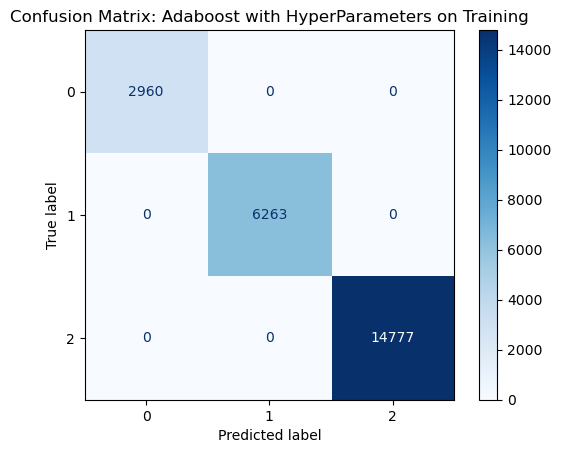

In [149]:
# Predictions
ytrain_pred = adaboost_hyp_model0.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("Adaboost with HyperParameters Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: Adaboost with HyperParameters on Training")
plt.show()

In [150]:
# Test Data

Accuracy = 1.0
Adaboost with HyperParameters Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



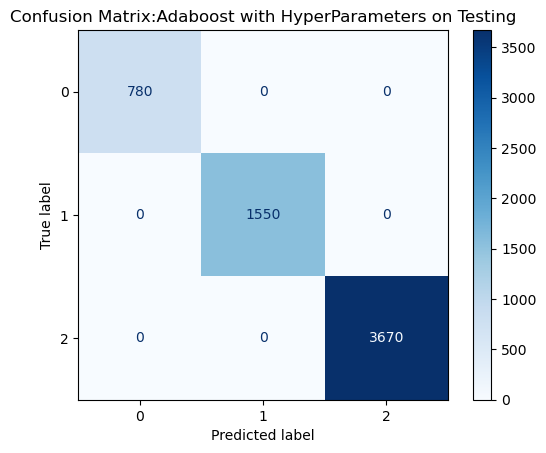

In [151]:
# Predictions
ytest_pred = adaboost_hyp_model0.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("Adaboost with HyperParameters Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:Adaboost with HyperParameters on Testing")
plt.show()

Number of weak learners: 1


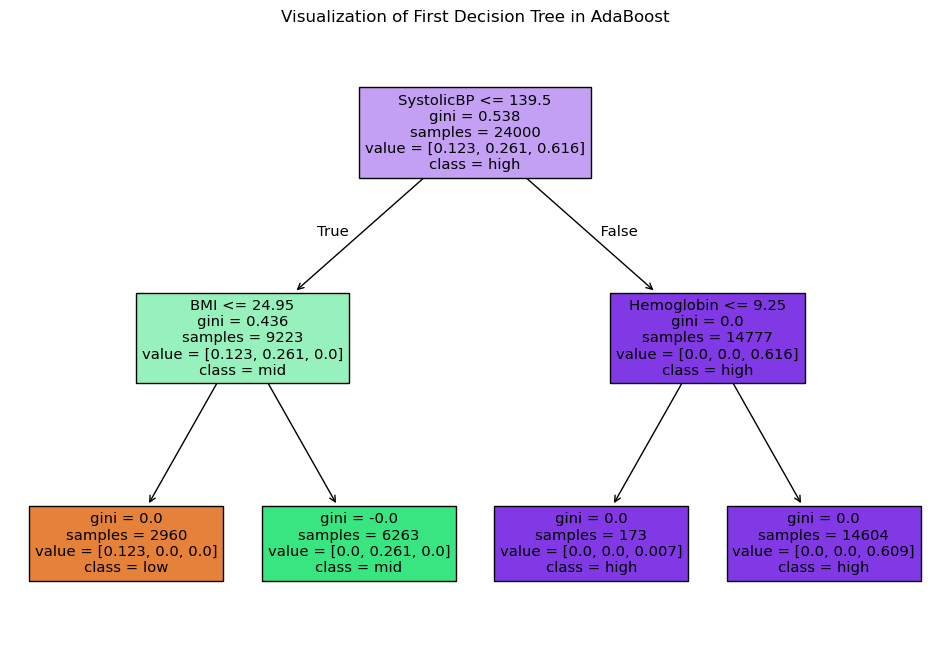

Figure saved as 'first_decision_tree Adaboost with HyperParameters.png'


In [152]:
# Check the number of weak learners
print("Number of weak learners:", len(adaboost.estimators_))

# Access and plot the first tree if available
if len(adaboost.estimators_) > 0:
    first_tree = adaboost.estimators_[0]
    plt.figure(figsize=(12, 8))
    plot_tree(
        first_tree,
        feature_names=X.columns.tolist(),  # Pass the updated feature names
        class_names=['low', 'mid', 'high'],  # Class names for target labels
        filled=True
    )
    plt.title("Visualization of First Decision Tree in AdaBoost")

    # Save the figure before showing it
    plt.savefig("first_decision_tree_adaboost.png", dpi=300, bbox_inches='tight')

    plt.show()
    print("Figure saved as 'first_decision_tree Adaboost with HyperParameters.png'")
else:
    print("No weak learners were created. Check the dataset or AdaBoost configuration.")


## Algorithm 5 : Gradient Boost 

In [154]:
# Create a Gradient Boosting Classifier object with default parameters
gradient_boost = GradientBoostingClassifier()
gradient_boost

GradientBoostingClassifier()

In [155]:
gradient_boost_model=gradient_boost.fit(xtrain,ytrain)
gradient_boost_model

GradientBoostingClassifier()

Accuracy = 1.0
Gradient Boost Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



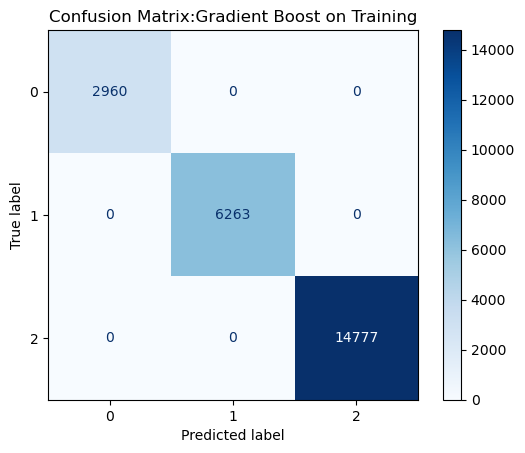

In [156]:
# Predictions
ytrain_pred = gradient_boost_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("Gradient Boost Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:Gradient Boost on Training")
plt.show()

Accuracy = 1.0
Gradient Boost Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



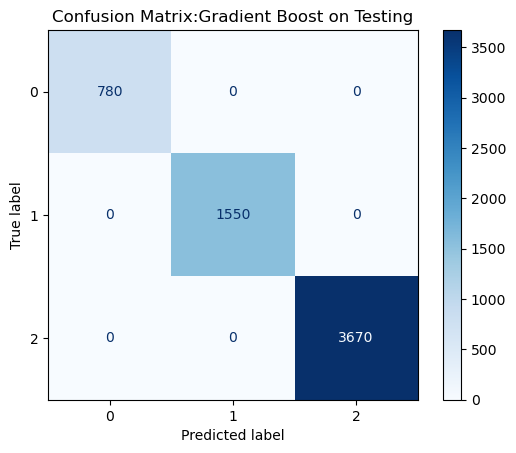

In [157]:
# Predictions
ytest_pred = gradient_boost_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("Gradient Boost Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:Gradient Boost on Testing")
plt.show()

Number of weak learners: 100


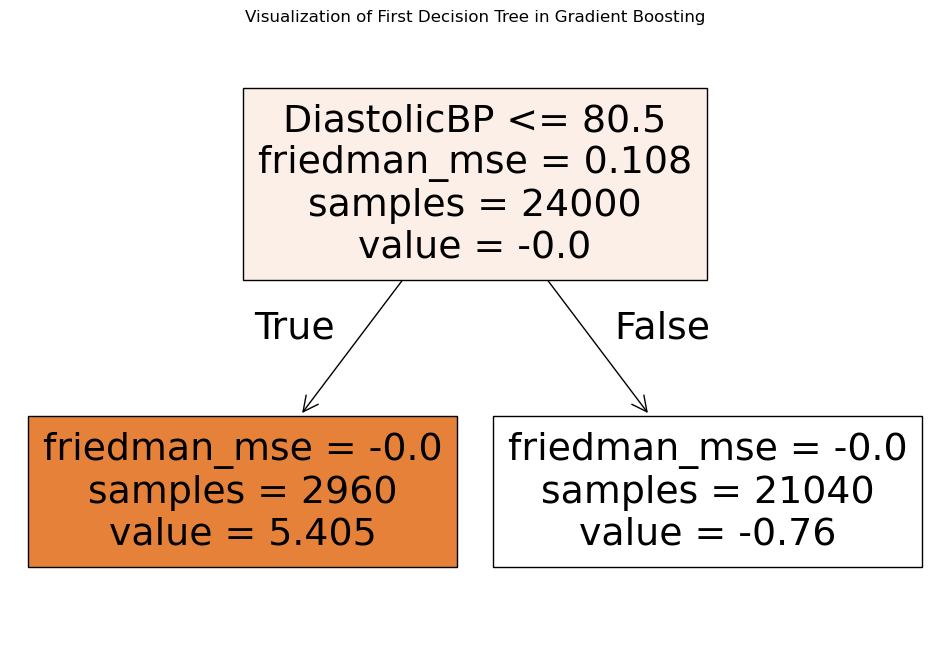

In [158]:
# Check the number of weak learners (trees)
print("Number of weak learners:", len(gradient_boost_model.estimators_))

# Access and plot the first tree if available
if len(gradient_boost_model.estimators_) > 0:
    first_tree = gradient_boost_model.estimators_[0, 0]  # Access the first tree in the ensemble (0, 0 index)
    plt.figure(figsize=(12, 8))
    plot_tree(
        first_tree,
        feature_names=X.columns.tolist(),  
        class_names=['low', 'mid', 'high'], 
        filled=True
    )
    plt.title("Visualization of First Decision Tree in Gradient Boosting")
    plt.show()
else:
    print("No weak learners were created. Check the dataset or Gradient Boosting configuration.")

## Gradient Boosting with Hyper Parameter

In [160]:
param_dist = {
    'n_estimators': np.arange(50, 201, 50),  # Number of boosting stages
    'learning_rate': [0.01, 0.05, 0.1, 0.2],  # Learning rate
    'max_depth': [3, 4, 5, 6],                # Maximum depth of trees
    'min_samples_split': [2, 3, 4],           # Minimum samples to split a node
    'min_samples_leaf': [1, 2, 3],            # Minimum samples at a leaf node
}

In [161]:
random_search = RandomizedSearchCV(
    estimator=gradient_boost,
    param_distributions=param_dist,
    cv=5,                        
)

In [162]:
# Fit the RandomizedSearchCV to the training data
random_search.fit(xtrain, ytrain)


RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(),
                   param_distributions={'learning_rate': [0.01, 0.05, 0.1, 0.2],
                                        'max_depth': [3, 4, 5, 6],
                                        'min_samples_leaf': [1, 2, 3],
                                        'min_samples_split': [2, 3, 4],
                                        'n_estimators': array([ 50, 100, 150, 200])})

In [163]:
# Display the best parameters found by RandomizedSearchCV
print("Best Hyperparameters:", random_search.best_params_)

Best Hyperparameters: {'n_estimators': 100, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_depth': 4, 'learning_rate': 0.01}


In [164]:
#Use the best estimator found by RandomizedSearchCV
gradient_boost_hyp = random_search.best_estimator_
gradient_boost_hyp

GradientBoostingClassifier(learning_rate=0.01, max_depth=4, min_samples_leaf=3,
                           min_samples_split=3)

Accuracy = 1.0
Gradient Boosting with Hyper Parameter Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



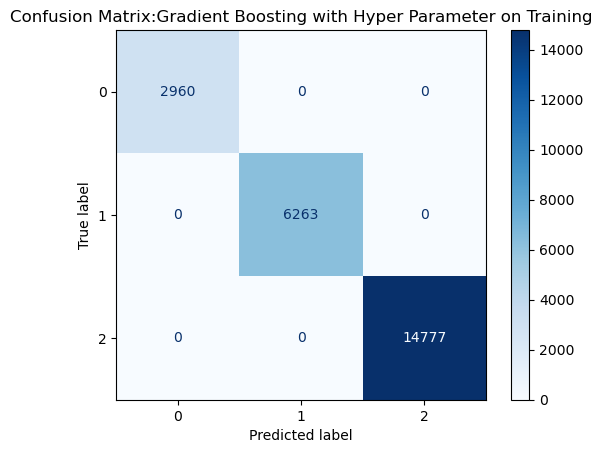

In [165]:
# Predictions
ytrain_pred = gradient_boost_hyp.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("Gradient Boosting with Hyper Parameter Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:Gradient Boosting with Hyper Parameter on Training")
plt.show()

Accuracy = 1.0
Gradient Boosting with Hyper Parameter Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



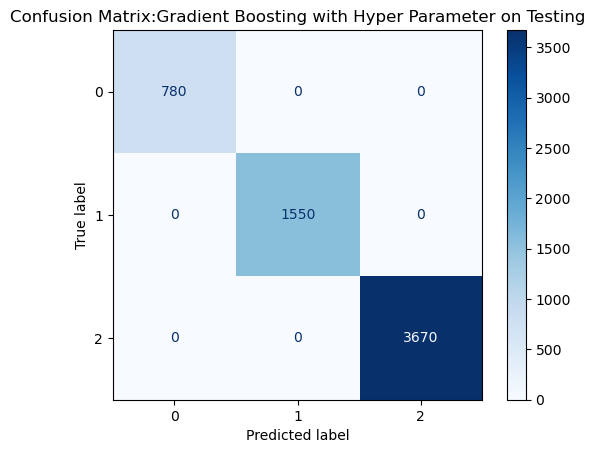

In [166]:
# Predictions
ytest_pred = gradient_boost_hyp.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("Gradient Boosting with Hyper Parameter Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:Gradient Boosting with Hyper Parameter on Testing")
plt.show()

Number of weak learners: 100


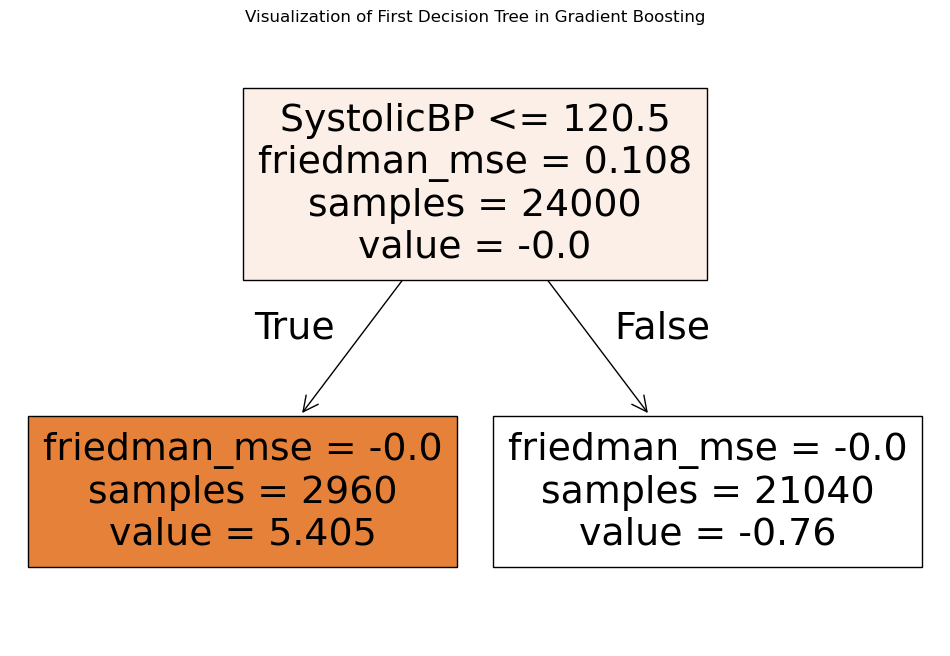

In [167]:
# Check the number of weak learners (trees)
print("Number of weak learners:", len(gradient_boost_hyp.estimators_))

# Access and plot the first tree if available
if len(gradient_boost_hyp.estimators_) > 0:
    first_tree = gradient_boost_hyp.estimators_[0, 0]  # Access the first tree in the ensemble (0, 0 index)
    plt.figure(figsize=(12, 8))
    plot_tree(
        first_tree,
        feature_names=X.columns.tolist(),  
        class_names=['low', 'mid', 'high'], 
        filled=True
    )
    plt.title("Visualization of First Decision Tree in Gradient Boosting")
    plt.show()
else:
    print("No weak learners were created. Check the dataset or Gradient Boosting configuration.")

## Algorithm 6 : xgboost 

In [169]:
# Define the XGBoost model with default parameters
xgboost = XGBClassifier()
xgboost

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [170]:
# Train the model
xgboost_model=xgboost.fit(xtrain, ytrain)
xgboost_model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

Accuracy = 1.0
xgboost Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



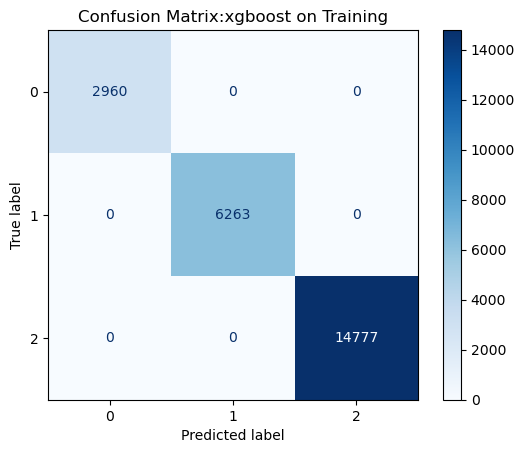

In [171]:
# Predictions
ytrain_pred = xgboost_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("xgboost Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:xgboost on Training")
plt.show()

Accuracy = 1.0
xgboost Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



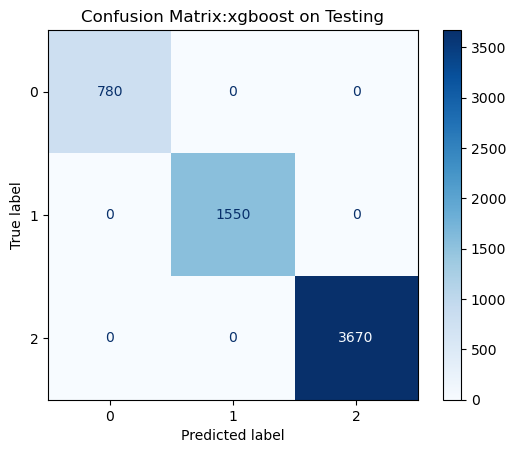

In [172]:
# Predictions
ytest_pred = xgboost_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("xgboost Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:xgboost on Testing")
plt.show()

## XGBoost With Hyper Parameter 

In [174]:
# Define the parameter grid for RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
    'max_depth': [3, 4, 5, 6, 7],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3, 0.4],  # Regularization term
}

In [175]:
# Initialize the XGBoost classifier
xgb_model = XGBClassifier()

In [176]:
# Perform RandomizedSearchCV with cross-validation to find the best hyperparameters
random_search = RandomizedSearchCV(xgb_model, param_distributions=param_dist, 
                                   n_iter=10, random_state=42, cv=5, verbose=2, n_jobs=-1)


In [177]:
# Fit the model
random_search.fit(xtrain, ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.6, 0.7, 0.8, 0.9,
                                                             1.0],
                                        'gamma': [0, 0.1, 0.2, 0.3, 0.4],
                                        'learning_rate': [0.01, 0.05, 0.1, 0.2,
                                                          0.3],
                                        'max_depth': [3, 4, 5, 6, 7],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500],
                                        'subsample': [0.6, 0.7, 0.8, 0.9, 1.0]},
                   random_state=42, verbose=2)

In [178]:
# Best hyperparameters from the search
print("Best Hyperparameters:", random_search.best_params_)

Best Hyperparameters: {'subsample': 0.6, 'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 0.8}


In [179]:
# Evaluate the model with the best hyperparameters
xgb_model_hyp = random_search.best_estimator_
xgb_model_hyp

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

Accuracy = 1.0
XGBoost With Hyper Parameter Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



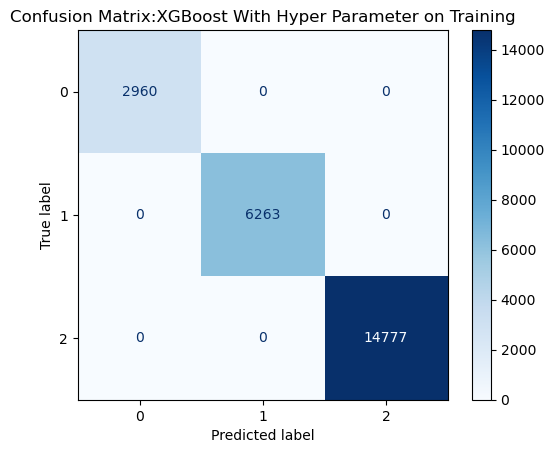

In [180]:
# Predictions
ytrain_pred = xgb_model_hyp.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("XGBoost With Hyper Parameter Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:XGBoost With Hyper Parameter on Training")
plt.show()

Accuracy = 1.0
xgboost With Hyper Parameter Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



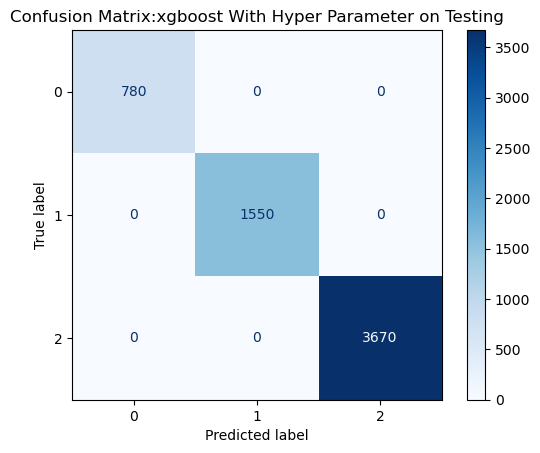

In [181]:
# Predictions
ytest_pred = xgb_model_hyp.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("xgboost With Hyper Parameter Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:xgboost With Hyper Parameter on Testing")
plt.show()

## Algorithm 7 : SVM Algorithm 

In [183]:
# Create and train the model
SVC = SVC()
SVC

SVC()

In [184]:
SVC_model=SVC.fit(xtrain, ytrain)
SVC_model

SVC()

Accuracy = 0.9999583333333333
SVM Algorithm Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



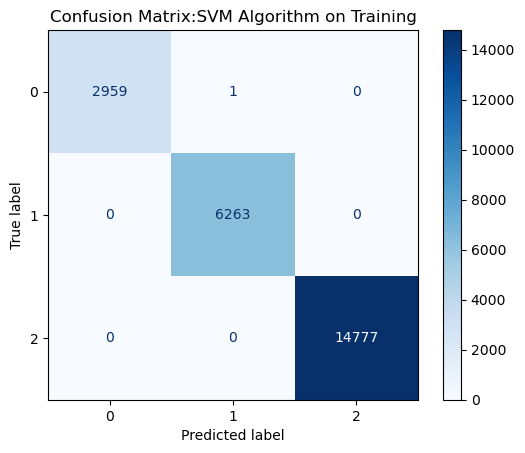

In [185]:
# Predictions
ytrain_pred = SVC_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("SVM Algorithm Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:SVM Algorithm on Training")
plt.show()

Accuracy = 1.0
SVM Algorithm Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



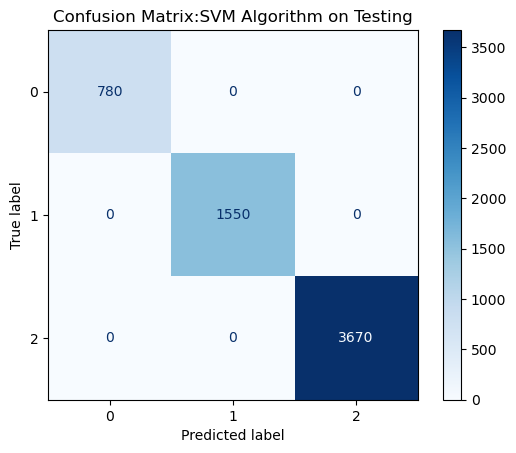

In [186]:
# Predictions
ytest_pred = SVC_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("SVM Algorithm Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:SVM Algorithm on Testing")
plt.show()

## SVM With Hyper Parameters 

In [188]:
# Setting hyperparameter distribution
param_distributions = {
    'C': np.logspace(-3, 3, 10),           # Regularization parameter
    'kernel': ['linear', 'rbf', 'poly'],   # Kernel types
}

In [189]:
# Using RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(
    estimator=SVC,
    param_distributions=param_distributions,
    cv=5,                        # Cross-validation folds
)

In [190]:
# Fitting the model
random_search.fit(xtrain, ytrain)


RandomizedSearchCV(cv=5, estimator=SVC(),
                   param_distributions={'C': array([1.00000000e-03, 4.64158883e-03, 2.15443469e-02, 1.00000000e-01,
       4.64158883e-01, 2.15443469e+00, 1.00000000e+01, 4.64158883e+01,
       2.15443469e+02, 1.00000000e+03]),
                                        'kernel': ['linear', 'rbf', 'poly']})

In [191]:
# Best hyperparameters
print("Best Parameters:", random_search.best_params_)

Best Parameters: {'kernel': 'poly', 'C': 46.41588833612773}


In [192]:
# Final model using the best parameters
svc_hyp_model = random_search.best_estimator_

Accuracy = 1.0
SVM With Hyper Parameters Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



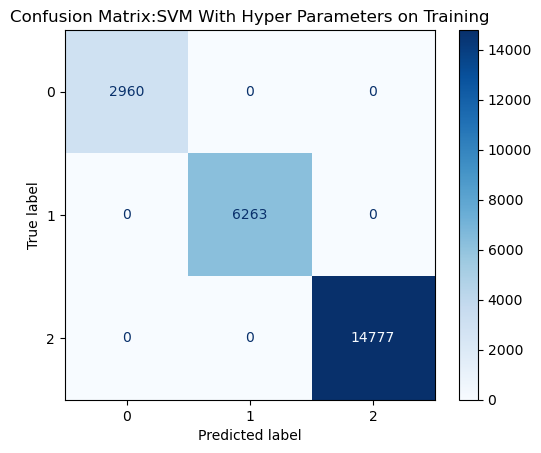

In [193]:
# Predictions
ytrain_pred = svc_hyp_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("SVM With Hyper Parameters Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:SVM With Hyper Parameters on Training")
plt.show()

Accuracy = 1.0
SVM With Hyper Parameters Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



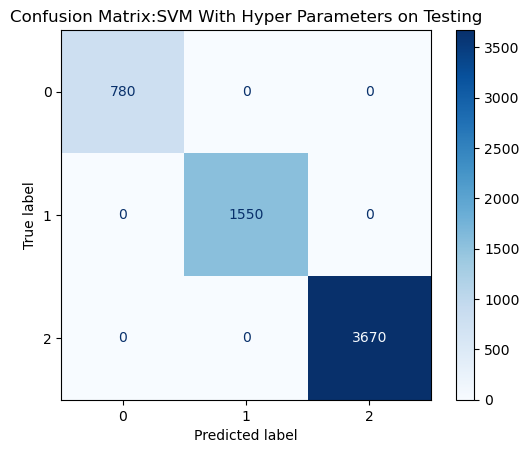

In [194]:
# Predictions
ytest_pred = svc_hyp_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("SVM With Hyper Parameters Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:SVM With Hyper Parameters on Testing")
plt.show()

## Algorithm 8: KNN (K-nearest Neighbour)

In [196]:
knn_clf = KNeighborsClassifier(n_neighbors=5)
knn_clf

KNeighborsClassifier()

In [197]:
knn_clf_model = knn_clf.fit(xtrain,ytrain)
knn_clf_model

KNeighborsClassifier()

Accuracy = 1.0
KNN (K-nearest Neighbour) Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



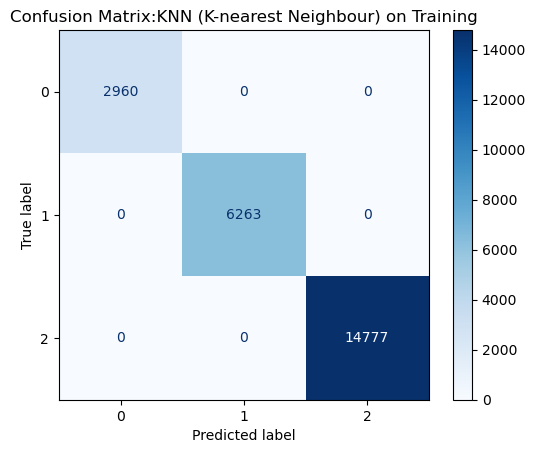

In [198]:
# Predictions
ytrain_pred = knn_clf_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("KNN (K-nearest Neighbour) Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:KNN (K-nearest Neighbour) on Training")
plt.show()

Accuracy = 1.0
KNN (K-nearest Neighbour) Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



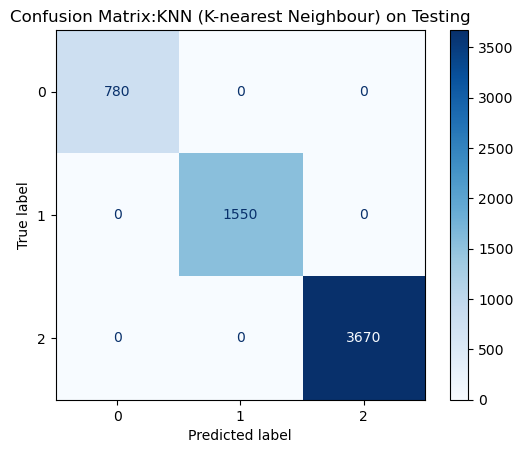

In [199]:
# Predictions
ytest_pred = knn_clf_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("KNN (K-nearest Neighbour) Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:KNN (K-nearest Neighbour) on Testing")
plt.show()

## KNN with hyper parameters 

In [201]:
# Define hyperparameter distributions
param_dist = {
    'n_neighbors': np.arange(1, 21),  # Number of neighbors (K)
    'weights': ['uniform', 'distance'],  # Weight function
    'metric': ['euclidean', 'manhattan']  # Distance metric
}

In [202]:
# Use RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(knn_clf, param_distributions=param_dist, n_iter=10, cv=5, scoring='accuracy', random_state=42, n_jobs=-1)
random_search.fit(xtrain, ytrain)

RandomizedSearchCV(cv=5, estimator=KNeighborsClassifier(), n_jobs=-1,
                   param_distributions={'metric': ['euclidean', 'manhattan'],
                                        'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20]),
                                        'weights': ['uniform', 'distance']},
                   random_state=42, scoring='accuracy')

In [203]:
# Get the best parameters
best_params = random_search.best_params_
print(f"Best Parameters: {best_params}")

Best Parameters: {'weights': 'uniform', 'n_neighbors': 1, 'metric': 'euclidean'}


In [204]:
# best model
best_knn = random_search.best_estimator_
best_knn

KNeighborsClassifier(metric='euclidean', n_neighbors=1)

Accuracy = 1.0
KNN with hyper parameters Classification Report on Training:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2960
           1       1.00      1.00      1.00      6263
           2       1.00      1.00      1.00     14777

    accuracy                           1.00     24000
   macro avg       1.00      1.00      1.00     24000
weighted avg       1.00      1.00      1.00     24000



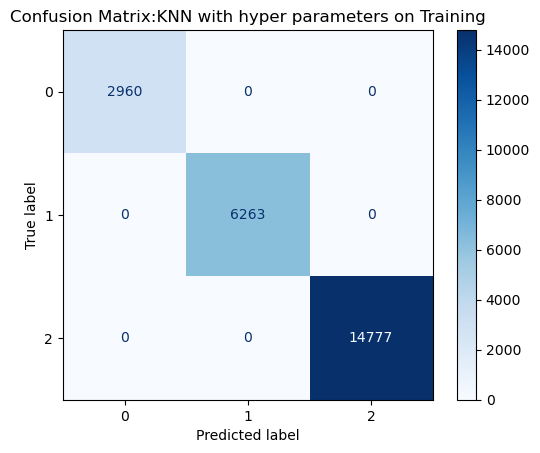

In [205]:
# Predictions
ytrain_pred = best_knn.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("KNN with hyper parameters Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:KNN with hyper parameters on Training")
plt.show()

Accuracy = 1.0
SVM With Hyper Parameters Classification Report on Testing:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       780
           1       1.00      1.00      1.00      1550
           2       1.00      1.00      1.00      3670

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000



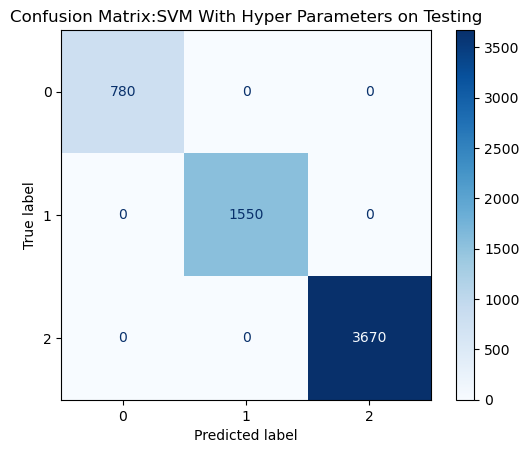

In [206]:
# Predictions
ytest_pred = best_knn.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("SVM With Hyper Parameters Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:SVM With Hyper Parameters on Testing")
plt.show()

## Algorithm 9:  Naïve Bayes

In [208]:
nb = MultinomialNB()
nb

MultinomialNB()

In [209]:
# Train the model
nb_model=nb.fit(xtrain, ytrain)
nb_model

MultinomialNB()

Accuracy = 0.956625
Naïve Bayes Classification Report on Training:
              precision    recall  f1-score   support

           0       0.97      0.90      0.94      2960
           1       0.89      0.95      0.92      6263
           2       0.98      0.97      0.98     14777

    accuracy                           0.96     24000
   macro avg       0.95      0.94      0.94     24000
weighted avg       0.96      0.96      0.96     24000



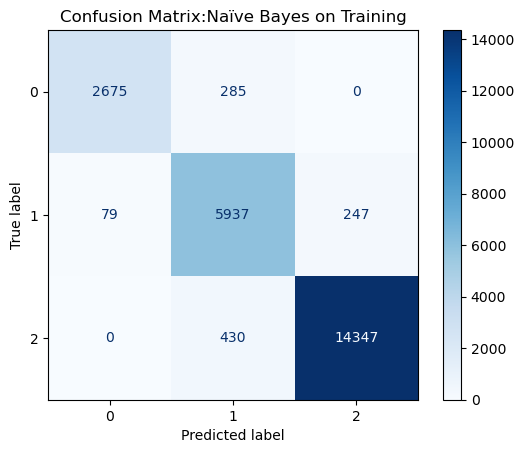

In [210]:
# Predictions
ytrain_pred = nb_model.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("Naïve Bayes Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:Naïve Bayes on Training")
plt.show()

Accuracy = 0.9573333333333334
Naïve Bayes Classification Report on Testing:
              precision    recall  f1-score   support

           0       0.99      0.90      0.94       780
           1       0.89      0.95      0.92      1550
           2       0.98      0.97      0.98      3670

    accuracy                           0.96      6000
   macro avg       0.95      0.94      0.95      6000
weighted avg       0.96      0.96      0.96      6000



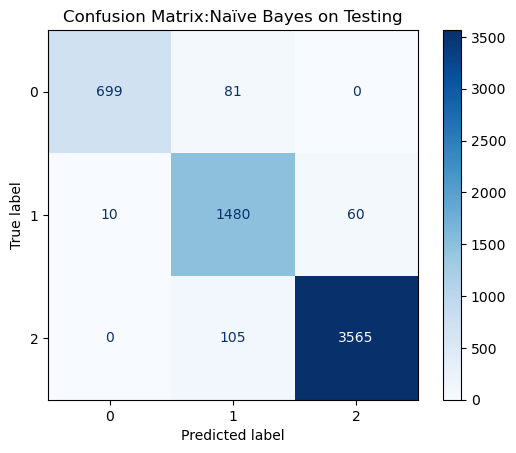

In [211]:
# Predictions
ytest_pred = nb_model.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("Naïve Bayes Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:Naïve Bayes on Testing")
plt.show()

## Naïve Bayes With Hyper Parameters 

In [213]:
# Define the Naïve Bayes model
nb = MultinomialNB()

# Define hyperparameter distribution
param_dist = {
    'alpha': np.linspace(0.01, 2.0, 50),  # Range from 0.01 to 2
    'fit_prior': [True, False]
}

In [214]:
# Use RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(nb, param_distributions=param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42, n_jobs=-1)
random_search.fit(xtrain, ytrain)

RandomizedSearchCV(cv=5, estimator=MultinomialNB(), n_iter=20, n_jobs=-1,
                   param_distributions={'alpha': array([0.01      , 0.05061224, 0.09122449, 0.13183673, 0.17244898,
       0.21306122, 0.25367347, 0.29428571, 0.33489796, 0.3755102 ,
       0.41612245, 0.45673469, 0.49734694, 0.53795918, 0.57857143,
       0.61918367, 0.65979592, 0.70040816, 0.74102041, 0.78163265,
       0.8222449 , 0.86285714, 0.90346939, 0.94408163, 0.98469388,
       1.02530612, 1.06591837, 1.10653061, 1.14714286, 1.1877551 ,
       1.22836735, 1.26897959, 1.30959184, 1.35020408, 1.39081633,
       1.43142857, 1.47204082, 1.51265306, 1.55326531, 1.59387755,
       1.6344898 , 1.67510204, 1.71571429, 1.75632653, 1.79693878,
       1.83755102, 1.87816327, 1.91877551, 1.95938776, 2.        ]),
                                        'fit_prior': [True, False]},
                   random_state=42, scoring='accuracy')

In [215]:
# Get the best parameters
best_params = random_search.best_params_
print(f"Best Parameters: {best_params}")

Best Parameters: {'fit_prior': True, 'alpha': 1.4314285714285715}


In [216]:
best_nb = random_search.best_estimator_
best_nb

MultinomialNB(alpha=1.4314285714285715)

Accuracy = 0.956625
Naïve Bayes With Hyper Parameters Classification Report on Training:
              precision    recall  f1-score   support

           0       0.97      0.90      0.94      2960
           1       0.89      0.95      0.92      6263
           2       0.98      0.97      0.98     14777

    accuracy                           0.96     24000
   macro avg       0.95      0.94      0.94     24000
weighted avg       0.96      0.96      0.96     24000



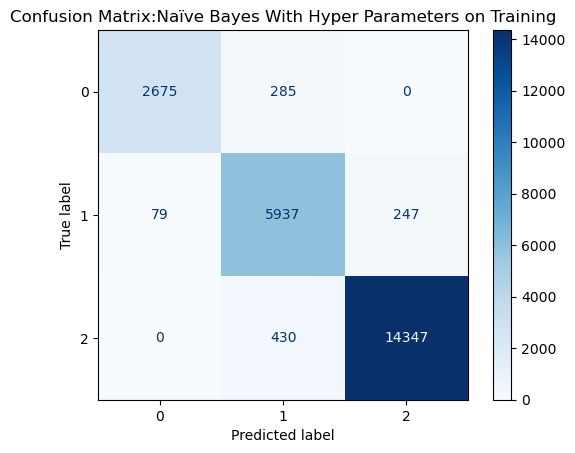

In [217]:
# Predictions
ytrain_pred = best_nb.predict(xtrain)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytrain,ytrain_pred)}")

# Classification Report
print("Naïve Bayes With Hyper Parameters Classification Report on Training:")
print(classification_report(ytrain, ytrain_pred))

# Confusion Matrix
cm = confusion_matrix(ytrain, ytrain_pred, labels=np.unique(y))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:Naïve Bayes With Hyper Parameters on Training")
plt.show()

Accuracy = 0.9573333333333334
Naïve Bayes With Hyper Parameters Classification Report on Testing:
              precision    recall  f1-score   support

           0       0.99      0.90      0.94       780
           1       0.89      0.95      0.92      1550
           2       0.98      0.97      0.98      3670

    accuracy                           0.96      6000
   macro avg       0.95      0.94      0.95      6000
weighted avg       0.96      0.96      0.96      6000



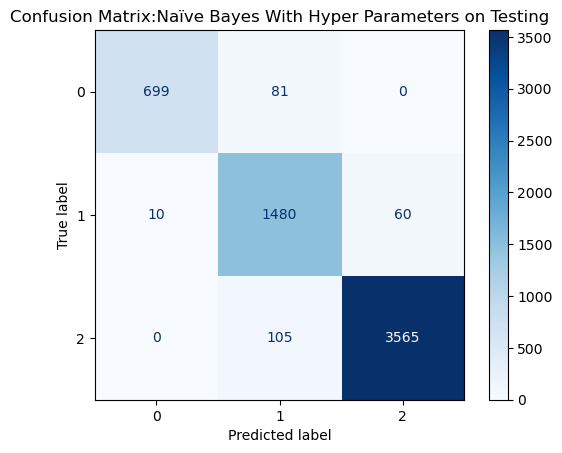

In [218]:
# Predictions
ytest_pred = best_nb.predict(xtest)

# Accuracy score
print(f"Accuracy = {accuracy_score(ytest,ytest_pred)}")

# Classification Report
print("Naïve Bayes With Hyper Parameters Classification Report on Testing:")
print(classification_report(ytest, ytest_pred))

# Confusion Matrix
cm = confusion_matrix(ytest, ytest_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix:Naïve Bayes With Hyper Parameters on Testing")
plt.show()

### Save model in pickle file

In [220]:
import pickle
with open("Maternal_Health_Dataset.pkl","wb") as f:
    pickle.dump(RF_model,f)

In [221]:
df.head(1)

,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate,RiskLevel,Hemoglobin,BMI,Parity,SmokingStatus,PhysicalActivityLevel
0,31.0,130.6,86.3,119.1,98.0,99.4,1,12.0,28.7,2.0,0,1


In [222]:
df.head(15)

,Age,SystolicBP,DiastolicBP,BS,BodyTemp,HeartRate,RiskLevel,Hemoglobin,BMI,Parity,SmokingStatus,PhysicalActivityLevel
0,31.0,130.6,86.3,119.1,98.0,99.4,1,12.0,28.7,2.0,0,1
1,35.0,152.2,93.4,187.0,98.0,118.6,2,12.0,31.2,2.0,0,1
2,29.0,124.2,87.2,112.0,100.0,74.6,1,12.0,27.2,2.0,0,0
3,30.0,147.6,99.6,172.3,98.0,101.5,2,12.0,36.0,2.0,0,1
4,35.0,127.9,83.7,111.1,98.0,66.8,1,12.0,28.6,2.0,0,0
5,23.0,162.8,103.7,148.3,98.0,109.9,2,12.0,32.8,2.0,0,1
6,23.0,126.5,82.6,112.2,98.0,63.5,1,12.0,25.7,2.0,0,1
7,35.0,137.4,88.2,107.9,98.6,94.3,1,12.0,25.4,2.0,0,0
8,32.0,145.1,96.0,170.8,98.0,101.5,2,12.0,36.0,2.0,0,1
9,42.0,136.5,82.8,117.4,98.0,80.6,1,12.0,28.6,2.0,0,1


## Prediction

In [224]:
# create function for take input and show output of prediction
from tabulate import tabulate
def Prediction(Age, SystolicBP, DiastolicBP, BS, BodyTemp, HeartRate, Hemoglobin, BMI, Parity, SmokingStatus, PhysicalActivityLevel):
    test_data = {
        "Age": [Age],
        "SystolicBP": [SystolicBP],
        "DiastolicBP": [DiastolicBP],
        "BS": [BS],
        "BodyTemp": [BodyTemp],
        "HeartRate": [HeartRate],
        "Hemoglobin": [Hemoglobin],
        "BMI": [BMI],
        "Parity": [Parity],
        "SmokingStatus": [SmokingStatus],
        "PhysicalActivityLevel": [PhysicalActivityLevel]
    }

    test_df = pd.DataFrame(test_data)

    # Convert DataFrame to a well-formatted table using tabulate
    input_data_str = tabulate(test_df, headers='keys', tablefmt='grid')

    with open("Maternal_Health_Dataset.pkl", "rb") as f:
        model = pickle.load(f)

    prediction = model.predict(test_df)[0]

    # Determine risk level and message
    if prediction == 0:
        risk_level = "🟢🟢🟢🟢🟢 Low Risk 🟢🟢🟢🟢🟢"
        message = "🌟 **Congratulations!** You're at low risk. Keep up the great work maintaining a healthy lifestyle! 🌱"
    elif prediction == 1:
        risk_level = "🟡🟡🟡🟡🟡 Mid Risk 🟡🟡🟡🟡🟡"
        message = "⚠️ **Mid Risk Alert**: It's time to take some precautions and consult with a healthcare professional for a thorough check-up. 🏥"
    elif prediction == 2:
        risk_level = "🔴🔴🔴🔴🔴 High Risk 🔴🔴🔴🔴🔴"
        message = "🚨 **High Risk Warning**: Immediate medical attention is recommended. Please contact your healthcare provider as soon as possible! 🆘"
    else:
        risk_level = "Unknown Risk Level ❓"
        message = "❗ **Error**: Prediction couldn't be determined. Please review the provided input data carefully."

    # Using a triple-quoted string for clean output formatting
    result = f"""
===============================================================================================================================================

**Maternal Health Risk Prediction**

===============================================================================================================================================

🔍 **Input Data**:

{input_data_str}

===============================================================================================================================================

**Risk Level: {risk_level}**

===============================================================================================================================================

{message}

===============================================================================================================================================
"""

    print(result)


In [225]:
Prediction(31.0,130.6,86.3,119.1,98.0,99.4,12.0,28.7,2.0,0,1)



**Maternal Health Risk Prediction**


🔍 **Input Data**:

+----+-------+--------------+---------------+-------+------------+-------------+--------------+-------+----------+-----------------+-------------------------+
|    |   Age |   SystolicBP |   DiastolicBP |    BS |   BodyTemp |   HeartRate |   Hemoglobin |   BMI |   Parity |   SmokingStatus |   PhysicalActivityLevel |
+====+=======+==============+===============+=======+============+=============+==============+=======+==========+=================+=========================+
|  0 |    31 |        130.6 |          86.3 | 119.1 |         98 |        99.4 |           12 |  28.7 |        2 |               0 |                       1 |
+----+-------+--------------+---------------+-------+------------+-------------+--------------+-------+----------+-----------------+-------------------------+


**Risk Level: 🟡🟡🟡🟡🟡 Mid Risk 🟡🟡🟡🟡🟡**


⚠️ **Mid Risk Alert**: It's time to take some precautions and consult with a healthcare professional for 

In [226]:
Prediction(35.0,152.2,93.4,187.0,98.0,118.6,12.0,31.2,2.0,0,1)



**Maternal Health Risk Prediction**


🔍 **Input Data**:

+----+-------+--------------+---------------+------+------------+-------------+--------------+-------+----------+-----------------+-------------------------+
|    |   Age |   SystolicBP |   DiastolicBP |   BS |   BodyTemp |   HeartRate |   Hemoglobin |   BMI |   Parity |   SmokingStatus |   PhysicalActivityLevel |
+====+=======+==============+===============+======+============+=============+==============+=======+==========+=================+=========================+
|  0 |    35 |        152.2 |          93.4 |  187 |         98 |       118.6 |           12 |  31.2 |        2 |               0 |                       1 |
+----+-------+--------------+---------------+------+------------+-------------+--------------+-------+----------+-----------------+-------------------------+


**Risk Level: 🔴🔴🔴🔴🔴 High Risk 🔴🔴🔴🔴🔴**


🚨 **High Risk Warning**: Immediate medical attention is recommended. Please contact your healthcare provider 

In [227]:
Prediction(20.0,115.6,74.3,95.7,100.0,79.7,12.0,21.0,2.0,0,1)



**Maternal Health Risk Prediction**


🔍 **Input Data**:

+----+-------+--------------+---------------+------+------------+-------------+--------------+-------+----------+-----------------+-------------------------+
|    |   Age |   SystolicBP |   DiastolicBP |   BS |   BodyTemp |   HeartRate |   Hemoglobin |   BMI |   Parity |   SmokingStatus |   PhysicalActivityLevel |
+====+=======+==============+===============+======+============+=============+==============+=======+==========+=================+=========================+
|  0 |    20 |        115.6 |          74.3 | 95.7 |        100 |        79.7 |           12 |    21 |        2 |               0 |                       1 |
+----+-------+--------------+---------------+------+------------+-------------+--------------+-------+----------+-----------------+-------------------------+


**Risk Level: 🟢🟢🟢🟢🟢 Low Risk 🟢🟢🟢🟢🟢**


🌟 **Congratulations!** You're at low risk. Keep up the great work maintaining a healthy lifestyle! 🌱




## Challenges in Maternal Health Risk Prediction Project:
selecting relevent features for predictions

Ensure the model work on unseen data

Need for collaboration with healthcare professionals to validate results.


## Future Scope:
Use wearable devices for live health tracking.

Personalized Health Tips: Offer diet, exercise, and care recommendations.

Improve predictions using data from multiple hospitals securely.

In [1]:
%%writefile metarnal_health_risk_prediction.py
import streamlit as st
import numpy as np
import pickle
import time

# ✅ Load Model
model_path = "Maternal_Health_Dataset.pkl"
try:
    with open(model_path, "rb") as f:
        model = pickle.load(f)
except FileNotFoundError:
    st.error("❌ Model file not found!")
    st.stop()

# ✅ Hospital-Themed UI Styling
st.set_page_config(page_title="Maternal Health Risk", page_icon="🤱", layout="wide")
st.markdown("""
    <style>
    body {background-color: #eafaf1; color: #2c3e50; font-family: 'Poppins', sans-serif;}
    .stButton>button {background-color: #4caf50; color: white; border-radius: 20px; font-size: 18px; padding: 10px 22px;}
    .title {font-size: 48px; font-weight: bold; color: #16a085; text-align: center;}
    .subtitle {font-size: 22px; color: #27ae60; text-align: center; font-style: italic;}
    .about-section {padding: 15px; background-color: #f4f9f4; border-radius: 15px; border-left: 5px solid #2ecc71; margin-bottom: 20px;}
    </style>
    """, unsafe_allow_html=True)

st.markdown("<div class='title'>🤱 Maternal Health Risk Predictor</div>", unsafe_allow_html=True)
st.markdown("<div class='subtitle'>🩺 Providing care through technology</div>", unsafe_allow_html=True)

with st.sidebar:
    st.header("🤱 About Our App")
    st.write("Our mission is to support maternal health with accurate, machine learning-based risk assessments.")
    st.write("This tool provides insights to help expectant mothers and healthcare providers make informed decisions.")
    st.markdown("</div>", unsafe_allow_html=True)
    st.header("💡 Quick Tips")
    st.write("✔️ Enter details accurately for better predictions.")
    st.write("✔️ Use results to consult healthcare providers.")



# ✅ Input Fields
Age = st.slider("👩‍🦰 Age (years)", 18, 45, 25)
SystolicBP = st.number_input("💓 Systolic BP (mm Hg)", value=120.0)
DiastolicBP = st.number_input("💙 Diastolic BP (mm Hg)", value=80.0)
BS = st.number_input("🍬 Blood Sugar Level", value=90.0)
Hemoglobin = st.number_input("🩸 Hemoglobin (g/dL)", value=13.0)
BMI = st.number_input("📊 BMI", value=22.0)
BodyTemp = st.number_input("🌡️ Body Temp (°F)", value=100.0)
HeartRate = st.number_input("❤️ Heart Rate (bpm)", value=70.0)
Parity = st.number_input("🤰 Pregnancies (Parity)", value=0)
SmokingStatus = 1 if st.selectbox("🚬 Smoker?", ['No', 'Yes']) == 'Yes' else 0
PhysicalActivityLevel = {'Low': 0, 'Moderate': 1, 'High': 2}[st.selectbox("🏃 Activity Level", ['Low', 'Moderate', 'High'])]

# ✅ Prediction Outcome with Tips
if st.button("📊 Predict Risk"):
    with st.spinner('⏳ Analyzing health metrics...'):
        time.sleep(2)
        user_input = np.array([[Age, SystolicBP, DiastolicBP, BS, BodyTemp, HeartRate, Hemoglobin, BMI, Parity, SmokingStatus, PhysicalActivityLevel]])
        try:
            prediction = model.predict(user_input)
            if prediction[0] == 2:
                st.error("🚨 High Risk! Urgent medical consultation advised.")
                st.info("💡 Tip: Maintain regular check-ups, manage blood pressure,monitor your sugar levels and avoid smoking.")
            elif prediction[0] == 1:
                st.warning("⚠️ Moderate Risk. Prioritize a healthier lifestyle.")
                st.info("💡 Tip: Increase physical activity, maintain a balanced diet, and monitor your sugar levels.")
            else:
                st.success("✅ Low Risk. Continue maintaining your well-being!")
                st.info("💡 Tip: Stay active, eat healthily, and attend regular health check-ups.")
        except Exception as e:
            st.error(f"❌ Prediction Error: {e}")

st.markdown("---")
st.markdown("👨‍💻 Built with ❤️ by Pratik Gaikwad")


Overwriting metarnal_health_risk_prediction.py
